# Previsão de Vendas + 

Analisaremos os dados de vendas de um varejista online do Reino Unido. 

Como a área de armazenamento pode ser cara e a entrega rápida no prazo é importante para prevalecer sobre a concorrência, gostamos de ajudar o varejista prevendo as quantidades diárias de produtos vendidos.

## Pesquisa de Soluções
### 1.0. Desk Research


https://facebook.github.io/prophet/docs/quick_start.html

https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html#modeling-holidays-and-special-events

# 0.0. Imports

In [206]:

import numpy as np
import pandas as pd
from scipy.stats import shapiro
from scipy import stats
from matplotlib.ticker import PercentFormatter


import seaborn as sns
from matplotlib import pyplot as plt
from plotly import express as px
import plotly.graph_objects as go
import pickle


from sklearn.cluster import KMeans
from sklearn               import metrics          as m
from sklearn               import preprocessing    as pp

from yellowbrick.cluster   import KElbowVisualizer,SilhouetteVisualizer
import inflection


from IPython.display       import Image
from IPython.core.display  import HTML
import warnings
import re
import datetime as dt
from itertools import combinations

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from fbprophet import Prophet
from sklearn.metrics import r2_score, mean_squared_error

pd.options.mode.chained_assignment = None


## 0.1 Path Handlers

In [96]:
data_raw_path = "../data/raw/"
data_processed_path = "../data/processed/"

## 0.2. Helper Functions


In [97]:
def jupyter_settings():
    %matplotlib inline
    %pylab inline
    %config InlineBackend.figure_format = 'retina'

    plt.style.use( 'bmh' )
    plt.rcParams['figure.figsize'] = [20, 10]
    plt.rcParams['font.size'] = 24

    display(HTML('<style>.container { width:100% !important; }</style>'))
    pd.options.display.max_columns = None
    pd.options.display.max_rows = None
    pd.options.display.float_format = '{:,.2f}'.format
    pd.set_option('display.expand_frame_repr', False)
    pd.set_option('display.max_columns', None)
    pd.set_option('display.max_rows', None)
    
    sns.set()



jupyter_settings()

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [98]:
## Function to reduce the DF size
##It is necessary that after using this code, carefully check the output results for each column.
def reduce_mem_usage(df, verbose=True):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    start_mem = df.memory_usage().sum() / 1024**2    
    for col in df.columns:
        col_type = df[col].dtypes
        if col_type in numerics:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)    
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    return df

In [99]:
def analyze_skewness_and_kurtosis(df):
    # Calculate kurtosis and skewness
    kurtosis = df.apply(lambda x: x.kurtosis())
    skew = df.apply(lambda x: x.skew())
    pvalue = df.apply(lambda x: shapiro(x)[1])
    # Describe data
    describe = df.describe().T
    # Add skew and kurtosis in describe
    describe['skew'] = skew
    describe['kurtosis'] = kurtosis
    describe['p_value'] = pvalue

    #analyze skewness
    #for symmetrical distribution: mean = median = mode
    #for positively skewed distribution: mode < median <mean
    #for negatively skewed distribution: mean < median <mode
    describe.loc[(describe['skew'] < 0.5) | (describe['skew'] > -0.5), 'skew_analysis'] = 'Low Skew'
    describe.loc[(describe['skew'] > 0.5) & (describe['skew'] < 1), 'skew_analysis'] = 'Medium Skew'
    describe.loc[(describe['skew'] < -0.5) & (describe['skew'] > -1), 'skew_analysis'] = 'Medium Skew'
    describe.loc[(describe['skew'] <= -1) | (describe['skew'] >= 1), 'skew_analysis'] = 'High Skew'

    #analyse kurtosis
    #Mesokurtic — having the kurtosis of 3 or excess kurtosis of 0. This group involves the normal distribution and some specific binomial distributions.
    #Leptokurtic — the kurtosis is greater than 3, or excess kurtosis is greater than 0. This is the distribution with fatter tails and a more narrow peak.
    #Platykurtic — the kurtosis is smaller than 3 or negative for excess kurtosis. This is a distribution with very thin tails compared to the normal distribution.    
    describe.loc[(describe['kurtosis'] > 3), 'kurtosis_analyses'] = 'Leptokurtic'
    describe.loc[(describe['kurtosis'] == 3), 'kurtosis_analyses'] = 'Mesokurtic'
    describe.loc[(describe['kurtosis'] < 3), 'kurtosis_analyses'] = 'Platykurtic'

    # histogram
    num_hist = df.hist( bins=25, figsize=(20,15) );

    # Show describe
    return describe
     # display histogram
    return num_hist

def diagnostic_plots(df, variable):
    # plot the histograms to have a quick look at the distributions
    # we can plot Q-Q plots to visualise if the variable is normally distributed
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df[variable].hist()

    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=pylab)

    plt.show()


## 0.3. Carregando Dados

In [100]:
df_raw = pd.read_excel( data_raw_path + 'DataSet_Test.xlsx', usecols="A:G")

In [101]:
df_raw.shape

(522064, 7)

# 1.0. Descrição dos dados

In [102]:
df1 = df_raw.copy(deep=True)

In [103]:
df1.head()

,BillNo,ItemName,Quantity,Date,Price,CustomerID,Country
0,536365,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,"17,850.00",United Kingdom
1,536365,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom
2,536365,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,"17,850.00",United Kingdom
3,536365,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom
4,536365,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom


## 1.1. Rename Columns

In [104]:
cols_old=['BillNo', 'ItemName', 'Quantity', 'Date', 'Price', 'CustomerID',
       'Country']
snakecase = lambda x: inflection.underscore( x )
cols_new = list( map( snakecase,cols_old ) )

#rename
df1.columns = cols_new
df1.columns

Index(['bill_no', 'item_name', 'quantity', 'date', 'price', 'customer_id',
       'country'],
      dtype='object')

## 1.2. Data Dimensions

In [105]:
print( 'Number of rows: {}'.format( df1.shape[0] ) )
print( 'Number of columns: {}'.format( df1.shape[1] ) )

Number of rows: 522064
Number of columns: 7


## 1.3 Data Types

In [106]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522064 entries, 0 to 522063
Data columns (total 7 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   bill_no      522064 non-null  object        
 1   item_name    520609 non-null  object        
 2   quantity     522064 non-null  int64         
 3   date         522064 non-null  datetime64[ns]
 4   price        522064 non-null  float64       
 5   customer_id  388023 non-null  float64       
 6   country      522064 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 27.9+ MB


## 1.4. Check Nulls and NAs

In [107]:
pd.DataFrame({'Null values' : df1.isnull().sum(),
             'NaN values' : df1.isna().sum() 
})

,Null values,NaN values
bill_no,0,0
item_name,1455,1455
quantity,0,0
date,0,0
price,0,0
customer_id,134041,134041
country,0,0


Identificando valores nan como String

In [108]:
df1.head()

,bill_no,item_name,quantity,date,price,customer_id,country
0,536365,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,"17,850.00",United Kingdom
1,536365,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom
2,536365,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,"17,850.00",United Kingdom
3,536365,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom
4,536365,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,"17,850.00",United Kingdom


In [109]:
#df1['item_name'] = df1['item_name'].apply(lambda x: str(x).lower())

df1.item_name.dropna().apply(
    lambda l: np.where("NAN" in l, True, False)
).value_counts()

False    519892
True        717
Name: item_name, dtype: int64

Transformando os valores "nan" em NaN

In [110]:
df1.dtypes

bill_no                object
item_name              object
quantity                int64
date           datetime64[ns]
price                 float64
customer_id           float64
country                object
dtype: object

In [111]:
df1['item_name'] = df1['item_name'].apply(lambda l: np.where("NAN" in str(l), None, l))

Identificando espaços em branco

In [112]:
df1.item_name.dropna().apply(
    lambda l: np.where("" == l, True, False)
).value_counts()

False    519892
Name: item_name, dtype: int64

In [113]:
print(f'Porcentagem de valores faltantes na coluna "customer_id" : {round((df1.isnull().sum()["customer_id"] * 100) / df1.shape[0], 3)}%')

Porcentagem de valores faltantes na coluna "customer_id" : 25.675%


25% dos dados 'customer_id' são nulos. 

Será incorreto atribuir valores como, por exemplo, valor médio/mediano, moda, etc (simplesmente não fará sentido).
Como não sabemos por que os clientes ou descrições estão faltando, vamos descartar todas essas ocorrências.

In [114]:
df1.sample()

,bill_no,item_name,quantity,date,price,customer_id,country
248038,559521,SET OF 9 BLACK SKULL BALLOONS,2,2011-07-08 16:26:00,0.85,NaN,Unspecified


In [115]:
isin_number = sum(np.isin(df1.loc[df1['item_name'].isna()].index, df1.loc[df1['customer_id'].isna()].index))
print(f'Quantidade de \'item_name\' nan indexados com a coluna \'customer_id\': {isin_number}')

Quantidade de 'item_name' nan indexados com a coluna 'customer_id': 1578


**Os valores faltantes na coluna `item_name` estão correlacionados com a coluna `customer_id`.**

**Deletar todos os valores nulos `customer_id` irá deletar todos os valores nulos da coluna `item_name`.**

## 1.5. Replace NA

In [116]:
df1 = df1.dropna(subset=['item_name','customer_id'])

In [117]:
df1.isnull().sum()

bill_no        0
item_name      0
quantity       0
date           0
price          0
customer_id    0
country        0
dtype: int64

## 1.6. Change dtypes

In [118]:
df1.dtypes

bill_no                object
item_name              object
quantity                int64
date           datetime64[ns]
price                 float64
customer_id           float64
country                object
dtype: object

In [119]:
bill_no_oneletter = df1.loc[df1['bill_no'].apply(lambda x: bool(re.search('[^0-9]+', str(x)))),:]
print('Number of invoices that have at least one letter:', bill_no_oneletter.shape[0])


Number of invoices that have at least one letter: 0


In [120]:
df1['customer_id']=df1['customer_id'].astype(int)
df1['bill_no'] = df1['bill_no'].astype(int)


In [121]:
# invoice_date
## Function to reduce the DF size
##It is necessary that after using this code, carefully check the output results for each column.
df_sample = reduce_mem_usage(df1)

Mem. usage decreased to 16.26 Mb (21.4% reduction)


In [122]:
df_sample.dtypes

bill_no                 int32
item_name              object
quantity                int32
date           datetime64[ns]
price                 float16
customer_id             int16
country                object
dtype: object

## 1.7. Descriptive Statistics

In [123]:
# checking final dtypes
df1.dtypes

bill_no                 int32
item_name              object
quantity                int32
date           datetime64[ns]
price                 float16
customer_id             int16
country                object
dtype: object

In [124]:
num_df1 = df1.select_dtypes(include=['int32','float16','int16'])
cat_df1 = df1.select_dtypes(exclude=['int32','float16','int16','datetime64[ns]'])

## 1.7.1 Numerical Atributtes

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\scipy\stats\_morestats.py:1761: UserWarning:

p-value may not be accurate for N > 5000.



,count,mean,std,min,25%,50%,75%,max,skew,kurtosis,p_value,skew_analysis,kurtosis_analyses
bill_no,"387,429.00","560,608.92","13,128.06","536,365.00","549,222.00","561,888.00","572,129.00","581,587.00",-0.18,-1.20,0.00,Low Skew,Platykurtic
quantity,"387,429.00",12.89,182.74,1.00,2.00,5.00,12.00,"80,995.00",398.64,"169,761.60",0.00,High Skew,Leptokurtic
price,"387,429.00",NaN,NaN,0.00,1.25,1.95,3.75,"8,144.00",NaN,NaN,0.00,NaN,NaN
customer_id,"387,429.00","15,316.82","1,721.93","12,346.00","13,950.00","15,265.00","16,837.00","18,287.00",0.01,-1.21,0.00,Low Skew,Platykurtic


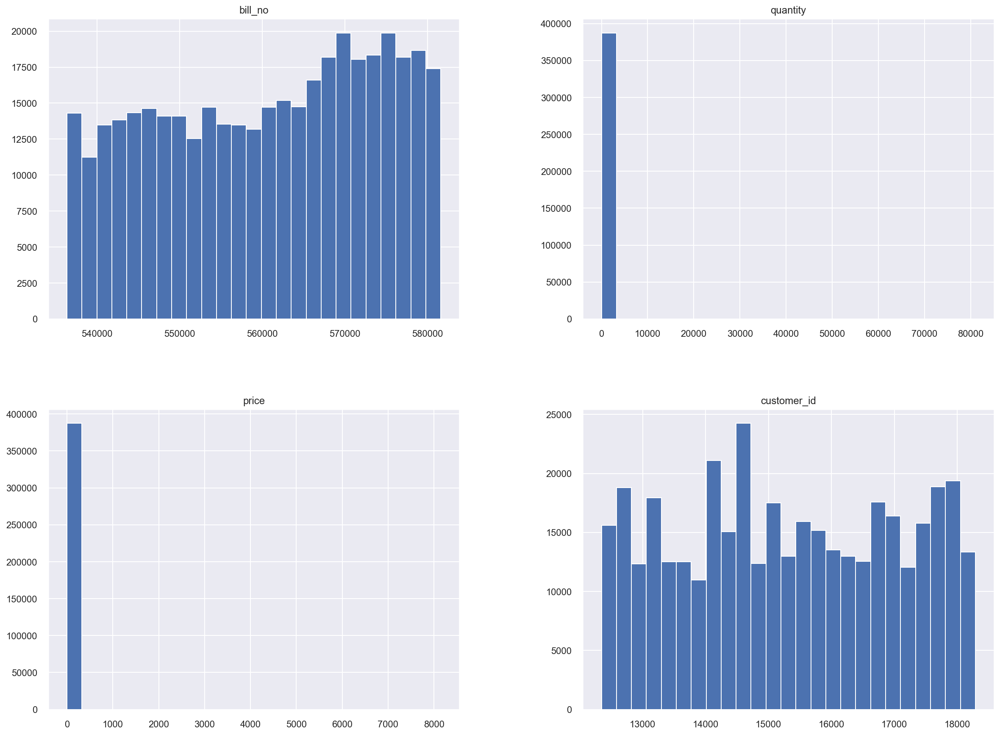

In [125]:
analyze_skewness_and_kurtosis(num_df1)

### 1.7.1.1 Price

In [126]:
df1.price.describe()

count   387,429.00
mean           NaN
std            NaN
min           0.00
25%           1.25
50%           1.95
75%           3.75
max       8,144.00
Name: price, dtype: float64

In [127]:
data = df1.loc[df1.price > 0].copy()

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



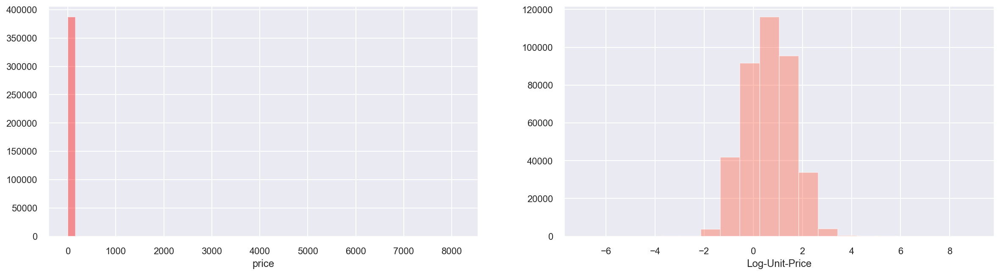

In [128]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.distplot(data.price, ax=ax[0], kde=False, color="red")
sns.distplot(np.log(data.price), ax=ax[1], bins=20, color="tomato", kde=False)
ax[1].set_xlabel("Log-Unit-Price");

In [129]:
np.exp(-2)

0.1353352832366127

In [130]:
np.exp(3)

20.085536923187668

In [131]:
np.quantile(data.price, 0.95)

8.5

Vamos focar as transações com preços que se enquadram nessa faixa, pois não queremos fazer previsões para produtos muito raramente com preços altos. Começar fácil é sempre bom!

### 1.7.1.2 Quantity

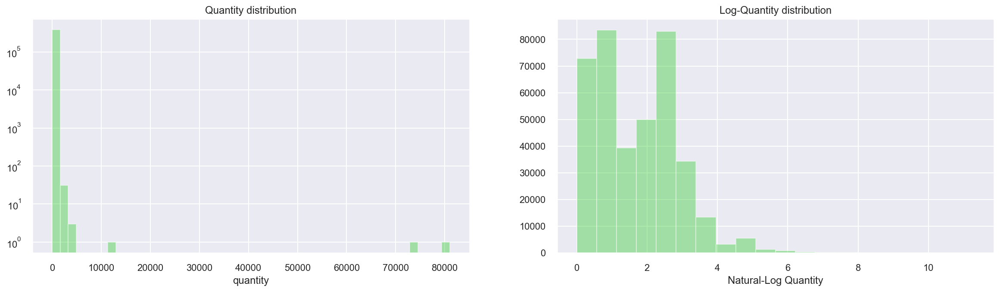

In [132]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.distplot(df1.quantity, ax=ax[0], kde=False, color="limegreen");
sns.distplot(np.log(df1.quantity), ax=ax[1], bins=20, kde=False, color="limegreen");
ax[0].set_title("Quantity distribution")
ax[0].set_yscale("log")
ax[1].set_title("Log-Quantity distribution")
ax[1].set_xlabel("Natural-Log Quantity");

In [133]:
np.exp(4)

54.598150033144236

In [134]:
np.quantile(df1.quantity, 0.95)

36.0

No caso de selecionar quantidades abaixo de 55 ainda cobriríamos mais de 95% dos dados!

## 1.7.2 Categorical Variables

In [135]:
cat_df1.head()

,item_name,country
0,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
1,WHITE METAL LANTERN,United Kingdom
2,CREAM CUPID HEARTS COAT HANGER,United Kingdom
3,KNITTED UNION FLAG HOT WATER BOTTLE,United Kingdom
4,RED WOOLLY HOTTIE WHITE HEART.,United Kingdom


### 1.7.3.1 Country

In [136]:
df1['country'].value_counts()

United Kingdom          353782
Germany                   9029
France                    8338
Spain                     2483
Netherlands               2361
Belgium                   2031
Switzerland               1840
Portugal                  1462
Australia                 1184
Norway                    1071
Italy                      757
Sweden                     451
Austria                    397
Poland                     330
Japan                      319
Israel                     248
Unspecified                243
Singapore                  222
Iceland                    181
USA                        179
Greece                     145
Malta                      112
United Arab Emirates        68
RSA                         58
Lebanon                     45
Lithuania                   35
Brazil                      32
Bahrain                     17
Saudi Arabia                 9
Name: country, dtype: int64

In [137]:
fig = go.Figure(go.Bar(
            x=df1['country'].value_counts().index,
            y=df1['country'].value_counts().values,
            orientation='v',         
            ))
fig.update_layout(yaxis_type="log")
fig.show()
#sns.barplot(x=lowchar_counts.index, y=lowchar_counts.values,data=tips, palette="Purples_r")
#plt.xticks(rotation=90);

Podemos ver que o varejista vende quase todos os produtos no Reino Unido, seguido por muitos países europeus. Quantas porcentagens de entradas estão dentro do Reino Unido?

In [138]:
df1.loc[df1.country=="United Kingdom"].shape[0] / df1.shape[0] * 100

91.3153119668378

In [139]:
df = df1[df1.country == "United Kingdom"]
df.loc[:, "date"] = pd.to_datetime(df.loc[:, "date"])

print(f"First observation on data is {df.date.min()}")
print(f"Last observation on data is {df.date.max()}")

print(f"We have {(df.date.max() - df.date.min()).days} days.")

First observation on data is 2010-12-01 08:26:00
Last observation on data is 2011-12-09 12:49:00
We have 373 days.


### 1.7.3.2 Item Name

In [140]:
# item_name
df1.item_name.nunique()

3844

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



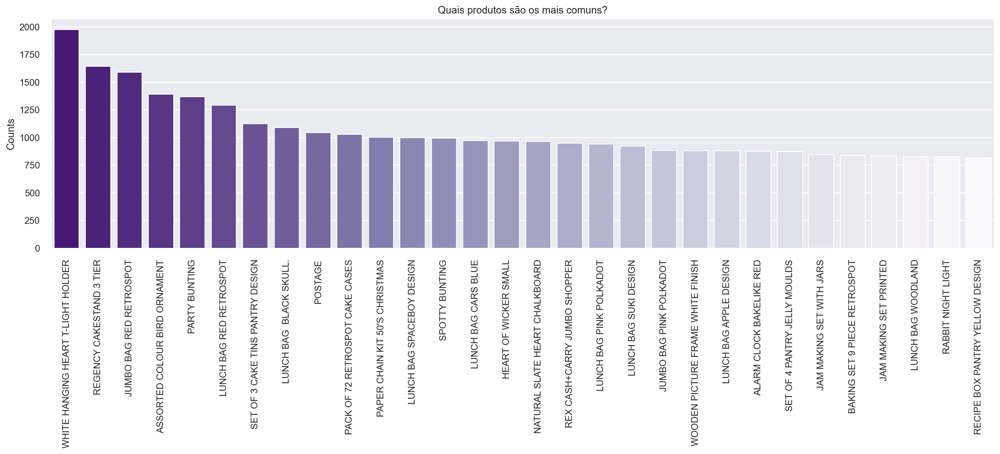

In [141]:
item_name_counts = df1.item_name.value_counts().sort_values(ascending=False).iloc[0:30]
plt.figure(figsize=(20,5))
sns.barplot(item_name_counts.index, item_name_counts.values, palette="Purples_r")
plt.ylabel("Counts")
plt.title("Quais produtos são os mais comuns?");
plt.xticks(rotation=90);

Alguns `item_names` correspondem a um mesmo tipo de produto, por exemplo **lunch bags**

In [142]:
def count_lower_chars(l):
    return sum(1 for c in l if c.islower())
    
df1["item_name_length"] = df1.item_name.apply(lambda l: len(l))
df1["low_chars_in_item_name"] = df1.item_name.apply(lambda l: count_lower_chars(l))

C:\Users\humbe\AppData\Local\Temp\ipykernel_19096\3461767918.py:2: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.



c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



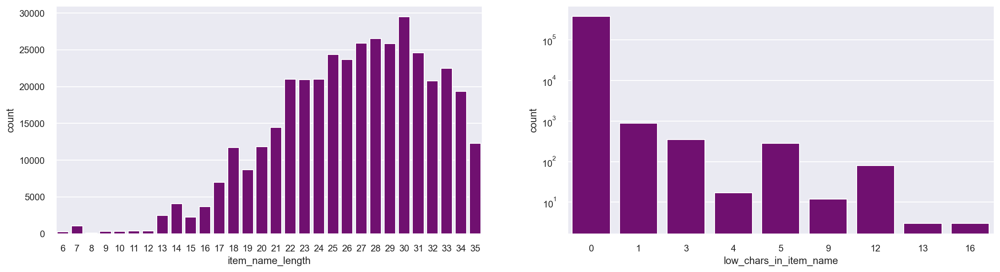

In [143]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
sns.countplot(df1.item_name_length, ax=ax[0], color="Purple")
sns.countplot(df1.low_chars_in_item_name, ax=ax[1], color="Purple")
ax[1].set_yscale("log")

In [144]:
import plotly.graph_objects as go

In [145]:
lowchar_counts = df1.loc[df1.low_chars_in_item_name > 0].item_name.value_counts()

fig = go.Figure(go.Bar(
            x=lowchar_counts.index,
            y=lowchar_counts.values,
            orientation='v',
            ))

fig.show()

Os `item_names`: `Manual`,`Bank Chages`,`Postage`,`High Resolution Image`,`Next Day Carriage`
são valores que devem ser analisados separadamente depois

Vamos calcular a fração de letras minúsculas em relação às letras maiúsculas

In [146]:
def count_upper_chars(l):
    return sum(1 for c in l if c.isupper())

df1["up_chars_in_item_name"] = df1.item_name.apply(lambda l: count_upper_chars(l))

C:\Users\humbe\AppData\Local\Temp\ipykernel_19096\341826765.py:2: DeprecationWarning:

Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.



In [147]:
df1.up_chars_in_item_name.describe()

count   387,429.00
mean         22.61
std           4.47
min           1.00
25%          20.00
50%          23.00
75%          26.00
max          32.00
Name: up_chars_in_item_name, dtype: float64

In [148]:
df1.loc[df1.up_chars_in_item_name <=5].item_name.value_counts()

Manual                   285
Next Day Carriage         79
Bank Charges              12
High Resolution Image      3
Name: item_name, dtype: int64

## 1.7.3 Datetime Analysis

In [149]:
df1.sample()

,bill_no,item_name,quantity,date,price,customer_id,country,item_name_length,low_chars_in_item_name,up_chars_in_item_name
179221,552821,DOORSTOP RETROSPOT HEART,1,2011-05-11 12:58:00,3.75,18118,United Kingdom,24,0,22


Quão longo é o período em dias?

In [150]:
df1["date"] = pd.to_datetime(df1.date, cache=True)

df1.date.max() - df1.date.min()

Timedelta('373 days 04:24:00')

In [151]:
print("Datafile starts with timepoint {}".format(df1.date.min()))
print("Datafile ends with timepoint {}".format(df1.date.max()))

Datafile starts with timepoint 2010-12-01 08:26:00
Datafile ends with timepoint 2011-12-09 12:50:00


## 1.7.2 Numerical Attributes Investigation
- 'unit_price' = 0 o que significa?
- Outliers nas variaveis 'quantity e price

## 1.7.4 Categorical Variables Investigation
- Só usar dados da UK
- Os `item_names`: `Manual`,`Bank Chages`,`Postage`,`High Resolution Image`,`Next Day Carriage` são valores que devem ser analisados separadamente depois
- Na Coluna `Contry` `European Community`, `Unspecified` são valores que devem ser analisados

# 2.0. Variable Filtering

In [152]:
df1 = df1.drop(columns=["item_name_length","low_chars_in_item_name","up_chars_in_item_name"])

In [153]:
df1.head()

,bill_no,item_name,quantity,date,price,customer_id,country
0,536365,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


In [154]:
pickle.dump(df1, open( data_processed_path+'df1.pkl', 'wb' ) )

In [155]:
df2 = pickle.load(open(data_processed_path+'df1.pkl', 'rb'))

In [156]:
df2.head()

,bill_no,item_name,quantity,date,price,customer_id,country
0,536365,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


In [157]:
# only UK
df2 = df2[df2.country == "United Kingdom"]
# dropping 'description'
df2 = df2.drop(columns='item_name', axis=1)
# 'quantity < 55
df2 = df2.loc[df2['quantity'] < 55, :]
# 'unit_price' > 0.04
df2= df2.loc[df2['price']>=0.04,:]

In [158]:
#df2.set_index("date", inplace = True)
df2.head()

,bill_no,quantity,date,price,customer_id,country
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


# 3.0. Feature Engineering

In [159]:
pickle.dump(df2, open( data_processed_path+'df2.pkl', 'wb' ))
df3 = pickle.load(open(data_processed_path+'df2.pkl', 'rb'))

## 3.1 Feature Creation

In [160]:
df3["revenue"] = df3.quantity * df3.price

In [161]:
df3.head()

,bill_no,quantity,date,price,customer_id,country,revenue
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [162]:
df3.sample()

,bill_no,quantity,date,price,customer_id,country,revenue
500252,580151,3,2011-12-02 10:21:00,2.10,17811,United Kingdom,6.30


In [163]:
pickle.dump(df3, open( data_processed_path+'df3.pkl', 'wb' ))

# 4.0. Segmentation Analysis

In [164]:
df4 = pickle.load(open(data_processed_path+'df3.pkl', 'rb'))

## 4.0 Cohort Analysis

Agruparemos os clientes para o primeiro registro de fatura. O índice de cohort será o número de meses desde a primeira transação.

In [165]:
df4.head()

,bill_no,quantity,date,price,customer_id,country,revenue
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [166]:
def get_month(x): 
    return dt.datetime(x.year, x.month, 1) 

def get_dates(df, col):
    
    year = df[col].dt.year
    month = df[col].dt.month
    day = df[col].dt.day
    
    return year, month, day

In [167]:
df4["month"] = df4['date'].apply(get_month)

df4["cohort_month"] = df4.groupby("customer_id")["month"].transform("min")

In [168]:
df4.head()

,bill_no,quantity,date,price,customer_id,country,revenue,month,cohort_month
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12-01,2010-12-01
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12-01,2010-12-01
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01


In [169]:
year, month, day = get_dates(df4, "month")
cohort_year, cohort_month, cohort_day = get_dates(df4, "cohort_month")

year_diff = year - cohort_year
month_diff = month - cohort_month

df4["cohort_index"] = 12 * year_diff + month_diff + 1

Os dados acima são nossa tabela de cohort. 

temos 790 clientes únicos com sua primeira transação em 2010-12. Seu mês de coorte é 2010-12 e o índice do cohort é 1. Vá na célula à direita, é 278. Sua média, 278 clientes únicos mantêm sua clientela para o próximo mês.

In [170]:
cohort_data = df4.groupby(["cohort_index", "cohort_month"])["customer_id"].nunique().reset_index()
cohort_pivot = cohort_data.pivot(index = "cohort_month", columns = "cohort_index", values = "customer_id")

cohort_pivot

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
cohort_month,,,,,,,,,,,,,
2010-12-01,790.00,278.00,253.00,289.00,279.00,315.00,277.00,265.00,273.00,308.00,286.00,394.00,208.00
2011-01-01,352.00,71.00,93.00,80.00,114.00,96.00,87.00,88.00,107.00,114.00,124.00,44.00,NaN
2011-02-01,329.00,61.00,66.00,95.00,97.00,85.00,83.00,90.00,89.00,103.00,23.00,NaN,NaN
2011-03-01,416.00,63.00,106.00,82.00,96.00,69.00,111.00,97.00,114.00,37.00,NaN,NaN,NaN
2011-04-01,272.00,58.00,55.00,57.00,54.00,62.00,61.00,70.00,20.00,NaN,NaN,NaN,NaN
2011-05-01,251.00,49.00,44.00,43.00,53.00,58.00,67.00,23.00,NaN,NaN,NaN,NaN,NaN
2011-06-01,209.00,36.00,28.00,49.00,49.00,67.00,21.00,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,173.00,29.00,37.00,41.00,48.00,20.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,139.00,30.00,31.00,34.00,18.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 4.1 Retention Rate

Formula = **(Número de clientes no período/Número total de clientes do período anterior) x 100 = Taxa de retenção de clientes [expressa em porcentagem]**

As tabelas de retenção mostram um grupo de pessoas que visitaram seu site ou usaram seu aplicativo pela primeira vez durante um determinado período. Eles também exibem a "queda" progressiva ou declínio na atividade ao longo do tempo para esse grupo específico (um cohort).

Os profissionais de marketing podem usar as tabelas de retenção para analisar a qualidade dos usuários trazidos por uma campanha de marketing e compará-la com outras fontes de tráfego.

In [171]:
cohort_sizes = cohort_pivot.iloc[:, 0]

retention = cohort_pivot.divide(cohort_sizes, axis = 0)
retention.index = retention.index.strftime("%Y-%m")

retention

cohort_index,1,2,3,4,5,6,7,8,9,10,11,12,13
cohort_month,,,,,,,,,,,,,
2010-12,1.00,0.35,0.32,0.37,0.35,0.40,0.35,0.34,0.35,0.39,0.36,0.50,0.26
2011-01,1.00,0.20,0.26,0.23,0.32,0.27,0.25,0.25,0.30,0.32,0.35,0.12,NaN
2011-02,1.00,0.19,0.20,0.29,0.29,0.26,0.25,0.27,0.27,0.31,0.07,NaN,NaN
2011-03,1.00,0.15,0.25,0.20,0.23,0.17,0.27,0.23,0.27,0.09,NaN,NaN,NaN
2011-04,1.00,0.21,0.20,0.21,0.20,0.23,0.22,0.26,0.07,NaN,NaN,NaN,NaN
2011-05,1.00,0.20,0.18,0.17,0.21,0.23,0.27,0.09,NaN,NaN,NaN,NaN,NaN
2011-06,1.00,0.17,0.13,0.23,0.23,0.32,0.10,NaN,NaN,NaN,NaN,NaN,NaN
2011-07,1.00,0.17,0.21,0.24,0.28,0.12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08,1.00,0.22,0.22,0.24,0.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


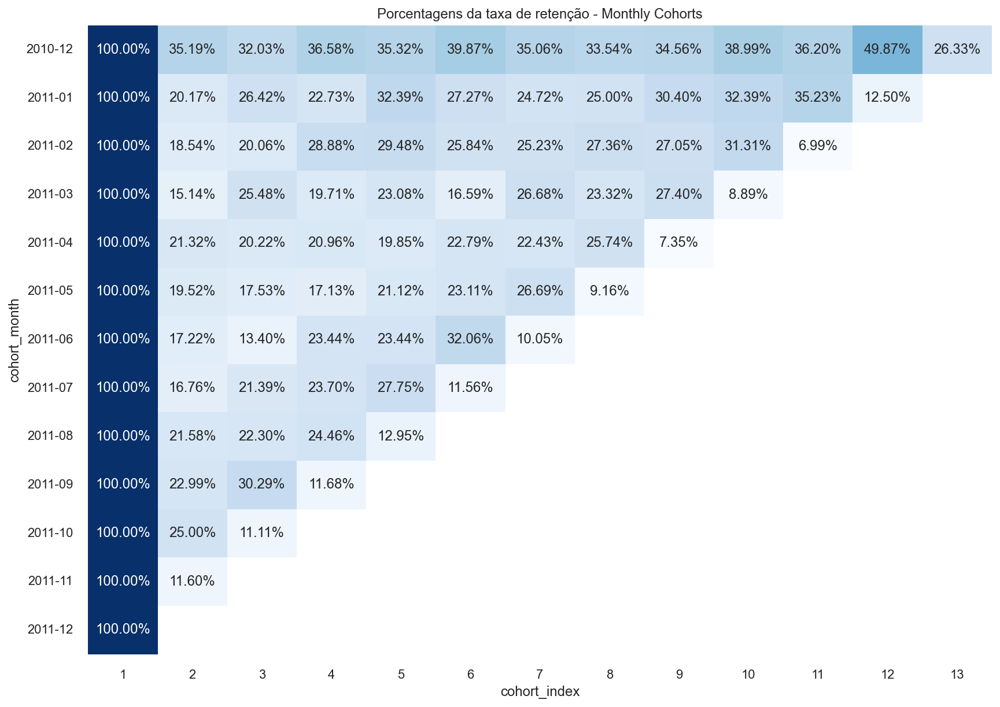

In [172]:
plt.rcParams["axes.facecolor"] = "white"
fig, ax = plt.subplots(figsize = (14, 10))

sns.heatmap(retention, cmap = "Blues", annot = True, fmt = ".2%", annot_kws = {"fontsize": 12}, cbar = False, ax = ax)

plt.title("Porcentagens da taxa de retenção - Monthly Cohorts")
plt.yticks(rotation = 0)
plt.show()

40,05% dos clientes que fizeram suas primeiras compras em janeiro de 2011, utilizam esta empresa após cinco meses.

In [174]:
customer_per_month = df4.groupby("cohort_month")["customer_id"].nunique().values
customers = customer_per_month.cumsum()
customers = customers[::-1]
customers

array([3855, 3822, 3529, 3205, 2931, 2792, 2619, 2410, 2159, 1887, 1471,
       1142,  790], dtype=int64)

In [175]:
customer_in_month = df4.groupby("cohort_index")["customer_id"].nunique()
customer_in_month

cohort_index
1     3855
2      853
3      832
4      802
5      808
6      772
7      707
8      633
9      603
10     562
11     433
12     438
13     208
Name: customer_id, dtype: int64

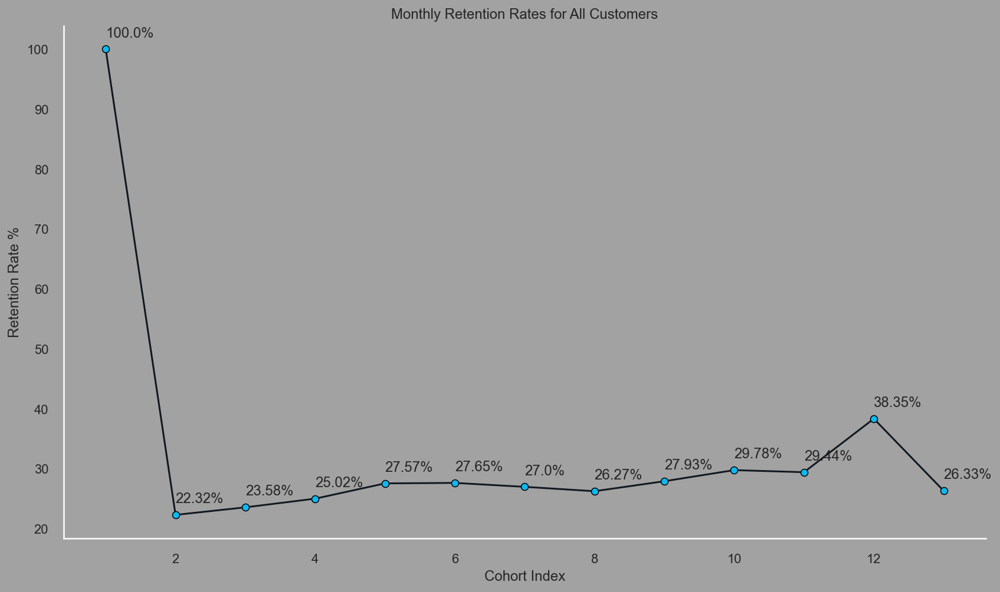

In [176]:
plt.rcParams["axes.facecolor"] = "#A2A2A2"
fig, ax = plt.subplots(figsize = (14, 8), facecolor = "#A2A2A2")
ax.grid(False)
x = customer_in_month.index
y = 100*(customer_in_month / customers)

sns.lineplot(x = x, y = y,  color = "#101820", marker = "o", markerfacecolor = "#0EB8F1", markeredgecolor = "#000000")

for x, y in zip(x, y):
    plt.text(x, y + 2, s = str(round(y, 2)) + "%")

plt.xlabel("Cohort Index")
plt.ylabel("Retention Rate %")
plt.title("Monthly Retention Rates for All Customers")
sns.despine()
plt.show()

A taxa de retenção aumenta significativamente nos últimos meses do ano.

Provavelmente, Ação de Graças, Black Friday e Natal causam isso. Há muitos dias especiais no final do ano.

In [177]:
monthly_customer_price_df = df4.groupby("month").agg({"revenue": "sum",
                                                            "customer_id": "nunique"})

monthly_customer_price_df

,revenue,customer_id
month,,
2010-12-01,"363,471.41",790
2011-01-01,"273,202.66",630
2011-02-01,"269,001.51",653
2011-03-01,"351,953.34",859
2011-04-01,"307,444.75",760
2011-05-01,"416,502.79",939
2011-06-01,"341,289.42",865
2011-07-01,"343,170.56",843
2011-08-01,"352,801.65",806


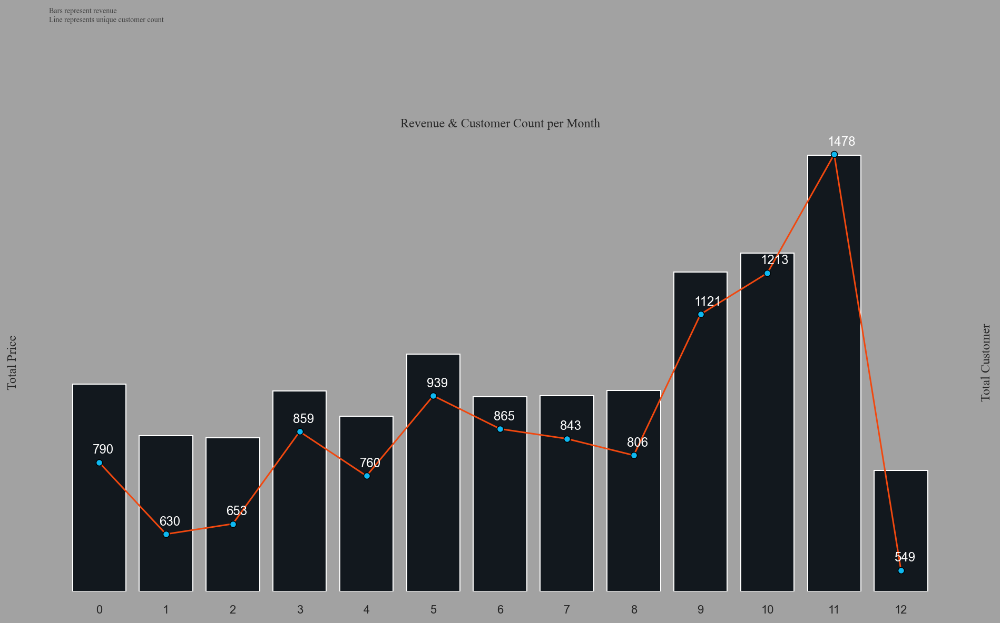

In [178]:
fig, ax = plt.subplots(figsize = (16, 8), facecolor = "#A2A2A2")
ax.set_facecolor("#A2A2A2")

sns.barplot(x = np.arange(len(monthly_customer_price_df.index)), y = monthly_customer_price_df.revenue, ax = ax,
            color = "#101820")
ax2 = ax.twinx()
sns.lineplot(x = np.arange(len(monthly_customer_price_df.index)), y = monthly_customer_price_df.customer_id, ax = ax2,
            color = "#F1480F", marker = "o", markerfacecolor = "#0EB8F1", markeredgecolor = "#000000")

ax.set_yticks([])
ax2.set_yticks([])
ax2.set_ylabel("Total Customer", fontname = "Times New Roman")
ax.set_ylabel("Total Price", fontname = "Times New Roman")
plt.title("Revenue & Customer Count per Month", fontname = "Times New Roman")
ax.text(-0.75, 1000000, "Bars represent revenue \nLine represents unique customer count", 
        fontsize = 7, alpha = 0.8, fontname = "Times New Roman")
for x, y in zip(np.arange(len(monthly_customer_price_df.index)),  monthly_customer_price_df.customer_id):
    ax2.text(x -0.1, y + 20 , y, color = "white")
    
sns.despine(left = True, right = True, bottom = True, top = True)
plt.show()

## 4.2 Principio de Pareto

O princípio de Pareto afirma que, para muitos resultados, cerca de 80% das consequências vêm de 20% das causas.

Outros nomes para este princípio são a regra 80/20.

Vamos implementar a regra 80-20 de Pareto em nosso conjunto de dados. Temos a seguinte hipótese:

1) 80% da receita da empresa vem de 20% do total de clientes.


Para verificar essa hipótese, precisamos de:

1) Registros de vendas individuais para cliente/produto

2) Calcular a soma acumulada para eles

In [179]:
df4.sample()

,bill_no,quantity,date,price,customer_id,country,revenue,month,cohort_month,cohort_index
353248,568880,1,2011-09-29 12:39:00,2.10,14524,United Kingdom,2.10,2011-09-01,2010-12-01,10


In [180]:
def prepare_pareto_data(df, col, price):
    '''
        encontra receita individual por cliente e calcula a porcentagem cumulativa deles.
    '''
    df_price = pd.DataFrame(df.groupby(col)[price].sum())
    df_price = df_price.sort_values(price, ascending = False)

    df_price["cumulative_percentage"] = (df_price[price].cumsum() / df_price[price].sum() * 100).round(2)
    
    return df_price

In [181]:
def create_pareto_plot(df, col, price, log = True):
    '''Monta o grafico com base na função prepare_pareto_data'''
    plt.rcParams["axes.facecolor"] = "#A2A2A2"
    fig, ax = plt.subplots(figsize = (15, 5), dpi = 150, facecolor = "#A2A2A2")
    plt.rcParams["axes.grid"] = False
    
    if log == True:
        sns.barplot(x = np.arange(len(df)), y = np.log(df[price]),  ax = ax, color = "#101820")
        ax.set_ylabel("Total Price (Log - Scale)")
    else:
        sns.barplot(x = np.arange(len(df)), y = df[price],  ax = ax, color = "#101820")

    ax2 = ax.twinx()
    
    sns.lineplot(x = np.arange(len(df)), y = df.cumulative_percentage, ax = ax2, color = "#0019AA")
    ax2.axhline(80, color = "#008878", linestyle = "dashed", alpha = 1)
    ax2.axhline(90, color = "#008878", linestyle = "dashed", alpha = 0.75)

    vlines = [int(len(df) * x / 10) for x in range(1, 10)]
    for vline in vlines: ax2.axvline(vline, color = "#008878", linestyle = "dashed", alpha = 0.1)
        
    interaction_80 = (df.shape[0] - df[df.cumulative_percentage >= 80].shape[0])
    ax2.axvline(interaction_80, color = "#008878", linestyle = "dashed", alpha = 1)

    interaction_80_percentage = round((interaction_80 / df.shape[0]) * 100)
    plt.text(interaction_80 + 25, 95, str(interaction_80_percentage) + "%")   
    
    prop = dict(arrowstyle= "-|>", color = "#000000", lw = 1.5, ls = "--")
    plt.annotate("", xy = (interaction_80 - 10, 80),  xytext = (interaction_80 + 120 , 73), arrowprops = prop)
    
    interaction_90 = (df.shape[0] - df[df.cumulative_percentage >= 90].shape[0])
    ax2.axvline(interaction_90, color = "#008878", linestyle = "dashed", alpha = 0.8)
    interaction_90_percentage = round((interaction_90 / df.shape[0]) * 100)
    plt.text(interaction_90 + 25, 95, str(interaction_90_percentage) + "%")   
    plt.annotate("", xy = (interaction_90 - 10, 90),  xytext = (interaction_90 + 120 , 83), arrowprops = prop)

    ax2.yaxis.set_major_formatter(PercentFormatter())
    ax.set_yticks([])
    plt.xticks([])
    ax.set_ylabel("Revenue", fontname = "Times New Roman")
    ax2.set_ylabel("Cumulative Percentage", fontname = "Times New Roman")
    subject = "Customers" if col == "customer_id" else "Products"
    plt.title("Pareto Chart for " + subject, fontname = "Times New Roman")
    ax.set_xlabel(subject, fontname = "Times New Roman")
    sns.despine(left = True, right = True, bottom = True, top = True)
    plt.show()

### 4.2.1 Gráfico de Pareto para Clientes

In [182]:
customer_price = prepare_pareto_data(df4, "customer_id", "revenue")

customer_price.head(10)

,revenue,cumulative_percentage
customer_id,,
14096,"63,477.38",1.23
13089,"51,191.59",2.23
14088,"42,535.62",3.05
17841,"40,427.89",3.84
14298,"40,198.30",4.62
17511,"34,498.83",5.29
12748,"29,520.62",5.86
15311,"26,516.45",6.38
13081,"25,306.29",6.87


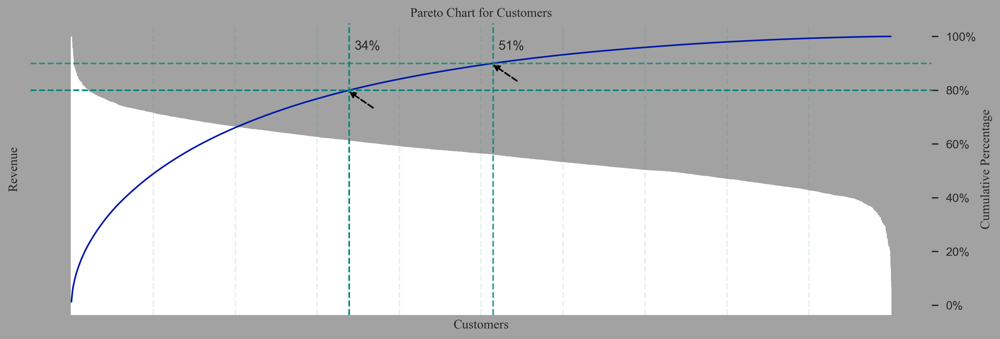

In [183]:
create_pareto_plot(customer_price, "customer_id", "revenue", log = True) # plotando o grafico em escala logaritmica para melhor visualização

- Podemos ver que 80% da receita da empresa vem de 34% dos principais clientes.

- Além disso, 90% da receita da empresa vem dos principais 51% dos clientes.

In [184]:
df4.head()

,bill_no,quantity,date,price,customer_id,country,revenue,month,cohort_month,cohort_index
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30,2010-12-01,2010-12-01,1
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00,2010-12-01,2010-12-01,1
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34,2010-12-01,2010-12-01,1


## 4.3 RFM Analysis

Recência, frequência, valor monetário é uma ferramenta de análise de marketing usada para identificar os melhores clientes de uma empresa ou organização usando determinadas medidas. O modelo RFM é baseado em três fatores quantitativos:

**Recência**: há quanto tempo um cliente fez uma compra

**Frequência**: com que frequência um cliente faz uma compra

**Valor monetário**: quanto dinheiro um cliente gasta em compras

In [185]:
print("Min date: {} \nMax date: {}".format(df4.date.min(), df4.date.max()))

Min date: 2010-12-01 08:26:00 
Max date: 2011-12-09 12:49:00


### 4.3.1 Montando a Tabela RFM

In [186]:
last_day = df4.date.max() + dt.timedelta(days = 1)

In [187]:
rfm_table = df4.groupby("customer_id").agg({"date": lambda x: (last_day - x.max()).days,
                                         "bill_no": "nunique",
                                         "revenue": "sum"})

rfm_table.rename(columns = {"date": "recency",
                            "bill_no": "frequency",
                            "revenue": "monetary"}, inplace = True)

rfm_table.head()

,recency,frequency,monetary
customer_id,,,
12747,2,11,"4,196.40"
12748,1,207,"29,520.62"
12749,4,5,"4,059.38"
12820,3,4,942.28
12821,214,1,92.73


In [188]:
r_labels = range(5, 0, -1)
fm_labels = range(1, 6)

rfm_table["R"] = pd.qcut(rfm_table["recency"], 5, labels = r_labels)
rfm_table["F"] = pd.qcut(rfm_table["frequency"].rank(method = 'first'), 5, labels = fm_labels)
rfm_table["M"] = pd.qcut(rfm_table["monetary"], 5, labels = fm_labels)

rfm_table.head()

,recency,frequency,monetary,R,F,M
customer_id,,,,,,
12747,2,11,"4,196.40",5,5,5
12748,1,207,"29,520.62",5,5,5
12749,4,5,"4,059.38",5,4,5
12820,3,4,942.28,5,4,4
12821,214,1,92.73,1,1,1


In [189]:
rfm_table["RFM_segment"] = rfm_table["R"].astype(str) + rfm_table["F"].astype(str) + rfm_table["M"].astype(str)
rfm_table["RFM_score"] = rfm_table[["R", "F", "M"]].sum(axis = 1)

rfm_table.head()

,recency,frequency,monetary,R,F,M,RFM_segment,RFM_score
customer_id,,,,,,,,
12747,2,11,"4,196.40",5,5,5,555,15
12748,1,207,"29,520.62",5,5,5,555,15
12749,4,5,"4,059.38",5,4,5,545,14
12820,3,4,942.28,5,4,4,544,13
12821,214,1,92.73,1,1,1,111,3


**Campeões**: Comprou recentemente, compra com frequência e gasta mais

**Clientes fiéis**: Compre regularmente. Responsivo a promoções.

**Potencial fiel**: clientes recentes com frequência média.

**Clientes recentes**: comprou mais recentemente, mas não com há frequência.

**Promissor**: compradores recentes, mas não gastaram muito.

**Precisa de atenção**: Recência, frequência e valores monetários acima da média. Pode não ter comprado muito recentemente.

**Prestes a dormir**: Recência e frequência abaixo da média. Vai perdê-los se não for reativado.

**Em risco**: Há algum tempo desde que eles compraram. Precisa trazê-los de volta!

**Não posso perdê-los**: comprava com frequência, mas não retornou por um longo tempo.

**Hibernando**: A última compra foi há muito tempo e possui baixo número de pedidos. Pode ser um cliente já perdido.

In [191]:
segt_map = {
    r'[1-2][1-2]': 'Hibernating',
    r'[1-2][3-4]': 'At-Risk',
    r'[1-2]5': 'Cannot lose them',
    r'3[1-2]': 'About To Sleep',
    r'33': 'Need Attention',
    r'[3-4][4-5]': 'Loyal Customers',
    r'41': 'Promising',
    r'51': 'New Customers',
    r'[4-5][2-3]': 'Potential Loyalists',
    r'5[4-5]': 'Champions'
}
rfm_table['segment'] = rfm_table['R'].astype(str) + rfm_table['F'].astype(str)
rfm_table['segment'] = rfm_table['segment'].replace(segt_map, regex=True)
rfm_table.head()

,recency,frequency,monetary,R,F,M,RFM_segment,RFM_score,segment
customer_id,,,,,,,,,
12747,2,11,"4,196.40",5,5,5,555,15,Champions
12748,1,207,"29,520.62",5,5,5,555,15,Champions
12749,4,5,"4,059.38",5,4,5,545,14,Champions
12820,3,4,942.28,5,4,4,544,13,Champions
12821,214,1,92.73,1,1,1,111,3,Hibernating


### 4.3.2 Visualizar o Grafico RFM

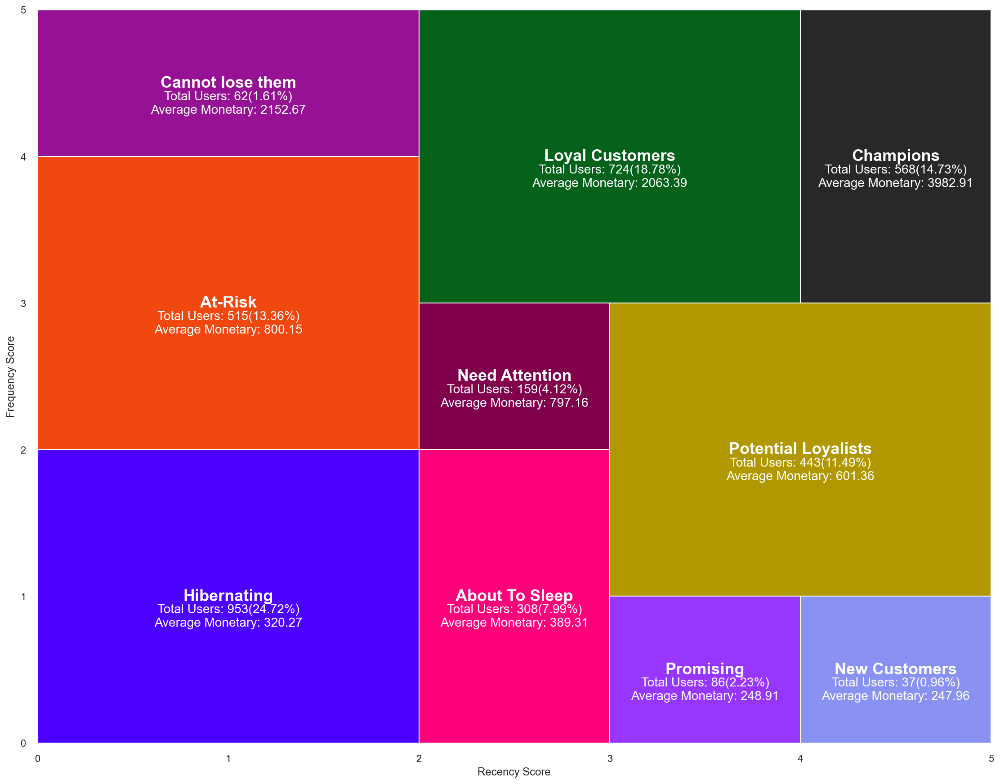

In [192]:
## Visualizing RFM Grid
rfm_coordinates = {"Champions": [3, 5, 0.8, 1],
                   "Loyal Customers": [3, 5, 0.4, 0.8],
                   "Cannot lose them": [4, 5, 0, 0.4],
                   "At-Risk": [2, 4, 0, 0.4],
                   "Hibernating": [0, 2, 0, 0.4],
                   "About To Sleep": [0, 2, 0.4, 0.6],
                   "Promising": [0, 1, 0.6, 0.8],
                   "New Customers": [0, 1, 0.8, 1],
                   "Potential Loyalists": [1, 3, 0.6, 1],
                   "Need Attention": [2, 3, 0.4, 0.6]}

fig, ax = plt.subplots(figsize = (19, 15))

ax.set_xlim([0, 5])
ax.set_ylim([0, 5])

plt.rcParams["axes.facecolor"] = "white"
palette = ["#282828", "#04621B", "#971194", "#F1480F",  "#4C00FF", 
           "#FF007B", "#9736FF", "#8992F3", "#B29800", "#80004C"]

for key, color in zip(rfm_coordinates.keys(), palette[:10]):
    
    coordinates = rfm_coordinates[key]
    ymin, ymax, xmin, xmax = coordinates[0], coordinates[1], coordinates[2], coordinates[3]
    
    ax.axhspan(ymin = ymin, ymax = ymax, xmin = xmin, xmax = xmax, facecolor = color)
    
    users = rfm_table[rfm_table.segment == key].shape[0]
    users_percentage = (rfm_table[rfm_table.segment == key].shape[0] / rfm_table.shape[0]) * 100
    avg_monetary = rfm_table[rfm_table.segment == key]["monetary"].mean()
    
    user_txt = "\n\nTotal Users: " + str(users) + "(" +  str(round(users_percentage, 2)) + "%)"
    monetary_txt = "\n\n\n\nAverage Monetary: " + str(round(avg_monetary, 2))
    
    x = 5 * (xmin + xmax) / 2
    y = (ymin + ymax) / 2
    
    plt.text(x = x, y = y, s = key, ha = "center", va = "center", fontsize = 18, color = "white", fontweight = "bold")
    plt.text(x = x, y = y, s = user_txt, ha = "center", va = "center", fontsize = 14, color = "white")    
    plt.text(x = x, y = y, s = monetary_txt, ha = "center", va = "center", fontsize = 14, color = "white")    
    
    ax.set_xlabel("Recency Score")
    ax.set_ylabel("Frequency Score")
    
sns.despine(left = True, bottom = True)
plt.show()

### 4.3.3 Visualisando RFM Segments

In [193]:
rfm_table.head()

,recency,frequency,monetary,R,F,M,RFM_segment,RFM_score,segment
customer_id,,,,,,,,,
12747,2,11,"4,196.40",5,5,5,555,15,Champions
12748,1,207,"29,520.62",5,5,5,555,15,Champions
12749,4,5,"4,059.38",5,4,5,545,14,Champions
12820,3,4,942.28,5,4,4,544,13,Champions
12821,214,1,92.73,1,1,1,111,3,Hibernating


In [194]:
rfm_table2 = rfm_table.reset_index()

rfm_monetary_size = rfm_table2.groupby("segment").agg({"monetary": "mean",
                                                       "customer_id": "nunique"})

rfm_monetary_size.rename(columns = {"monetary": "mean_monetary", "customer_id": "customer_count"}, inplace = True)
rfm_monetary_size = rfm_monetary_size.sort_values("mean_monetary", ascending = False)

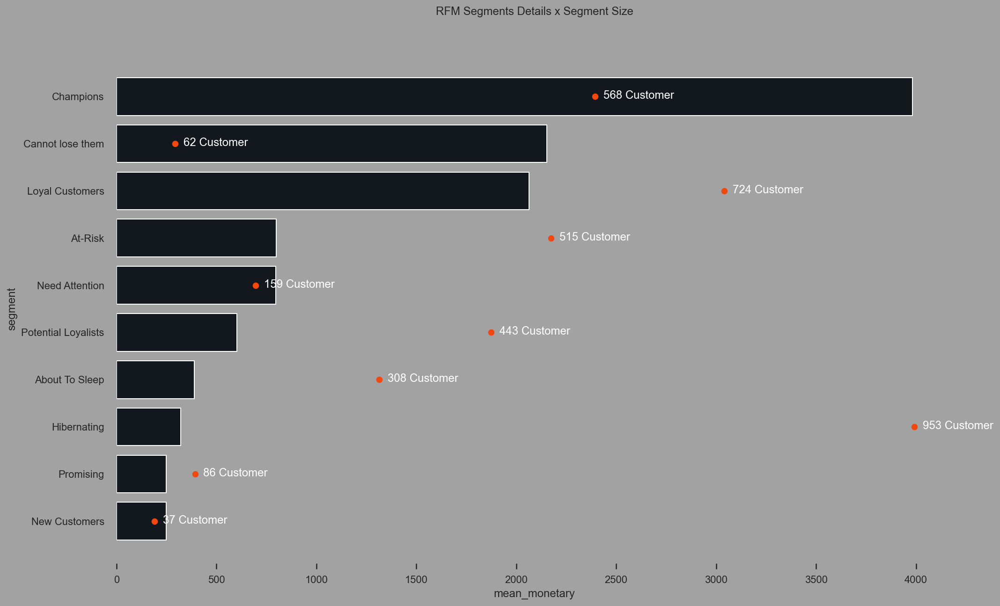

In [195]:
plt.rcParams["axes.facecolor"] = "#A2A2A2"
fig, ax = plt.subplots(figsize = (16, 10), facecolor = "#A2A2A2")

sns.barplot(x = rfm_monetary_size.mean_monetary, y = rfm_monetary_size.index, ax = ax, color = "#101820")
ax2 = ax.twiny()
sns.lineplot(x = rfm_monetary_size.customer_count, y = rfm_monetary_size.index, ax = ax2, marker = "o", linewidth = 0,
             color = "#F1480F", markeredgecolor = "#F1480F")


ax2.axis("off")

for y, x in list(enumerate(rfm_monetary_size.customer_count)):
    ax2.text(x + 10, y + 0.05, str(x) + " Customer", color = "white", fontweight = "normal")

plt.title("RFM Segments Details x Segment Size")
sns.despine(left = True, right = True, bottom = True, top = True)
plt.show()

In [196]:
rfm = rfm_table2.groupby("segment").agg({"customer_id": "nunique", 
                                        "recency": "mean",
                                        "frequency": "mean",
                                        "monetary": "mean"})
rfm.rename(columns = {"customer_id": "Segment Size"}, inplace = True)

cm = sns.light_palette("#A2A2A2", as_cmap = True)

rfm.T.style.background_gradient(cmap = cm, axis = 1)\
.set_precision(2)\
.highlight_min(axis = 1, color = "#195190")\
.highlight_max(axis = 1, color = "#D60000")

C:\Users\humbe\AppData\Local\Temp\ipykernel_19096\3430514276.py:9: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



segment,About To Sleep,At-Risk,Cannot lose them,Champions,Hibernating,Loyal Customers,Need Attention,New Customers,Potential Loyalists,Promising
Segment Size,308.00,515.00,62.00,568.00,953.00,724.00,159.00,37.00,443.00,86.00
recency,52.91,153.67,134.89,5.92,215.22,33.50,51.76,7.27,17.16,23.45
frequency,1.16,2.85,8.27,11.65,1.09,6.29,2.32,1.00,2.01,1.00
monetary,389.31,800.15,2152.67,3982.91,320.27,2063.39,797.16,247.96,601.36,248.91


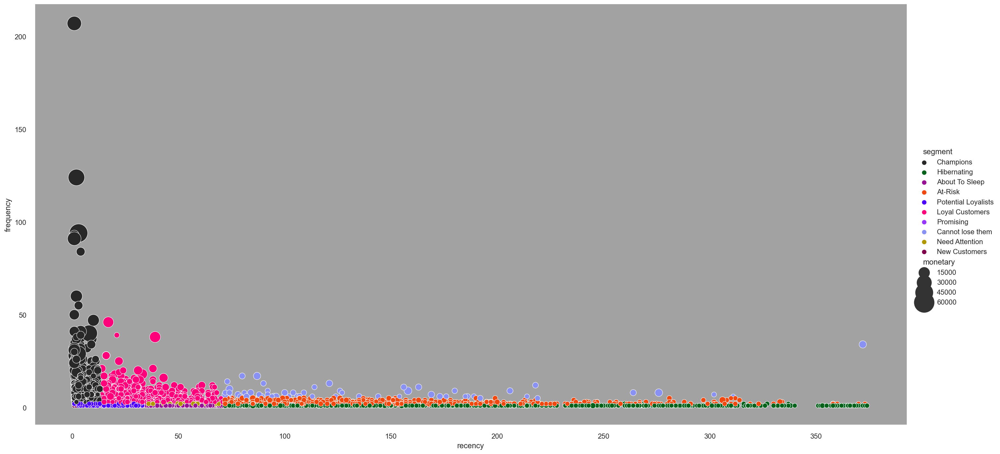

In [197]:
plt.rcParams["axes.facecolor"] = "#A2A2A2"
plt.rcParams["axes.grid"] = False

sns.relplot(x = "recency", y = "frequency", hue = "segment", size = "monetary", data = rfm_table2, palette = palette,
            height = 10, aspect = 2, sizes = (50, 1000))

plt.show()

In [198]:
monetary_per_segment = (rfm_table2.groupby("segment")["monetary"].sum() /\
                        rfm_table2.groupby("segment")["monetary"].sum().sum()).sort_values(ascending = False)

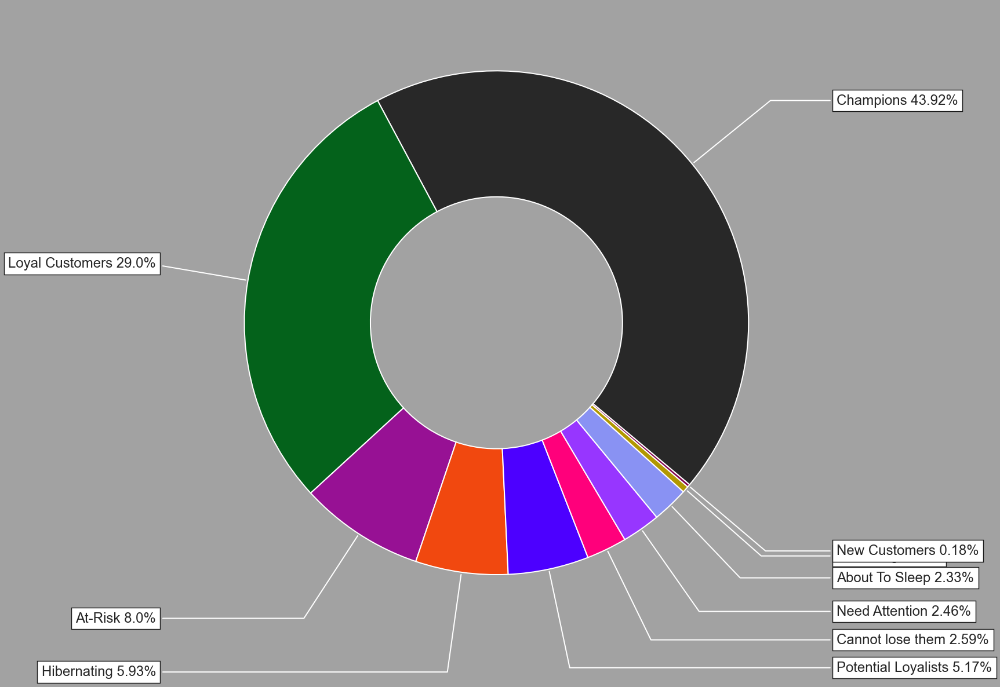

In [199]:
fig, ax = plt.subplots(figsize = (10, 10), facecolor = "#A2A2A2")

wedges, texts = ax.pie(monetary_per_segment.values, wedgeprops=dict(width=0.5), 
                       startangle=-40, normalize=False, colors = palette)

bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
kw = dict(arrowprops=dict(arrowstyle="-"),
          bbox=bbox_props, zorder=0, va="center")

for i, p in enumerate(wedges):
    ang = (p.theta2 - p.theta1)/2. + p.theta1
    y = np.sin(np.deg2rad(ang))
    x = np.cos(np.deg2rad(ang))
    horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
    connectionstyle = "angle,angleA=0,angleB={}".format(ang)
    kw["arrowprops"].update({"connectionstyle": connectionstyle})
    ax.annotate(monetary_per_segment.index[i] + " " + str(round(monetary_per_segment[i] * 100, 2)) + "%", xy=(x, y), 
                xytext=(1.35*np.sign(x), 1.4*y),horizontalalignment=horizontalalignment, **kw)
plt.show()

43,92% da receita total vem do segmento "Champions" e 29% da receita total vem do segmento "Loyal Customer". Esses dois segmentos representam 72,92% da receita total da empresa.

In [200]:
rfm_clustering = rfm_table2[["recency", "frequency", "monetary", "segment"]]

for col in ["recency", "frequency", "monetary"]:
    scaler = pp.StandardScaler()
    rfm_clustering[col] = np.log(rfm_clustering[col])
    rfm_clustering[col] = scaler.fit_transform(rfm_clustering[col].values.reshape(-1, 1))
    
rfm_melted = pd.melt(rfm_clustering, id_vars = "segment", value_vars = ["recency", "frequency", "monetary"],
                     var_name = "RFM", value_name = "Value")

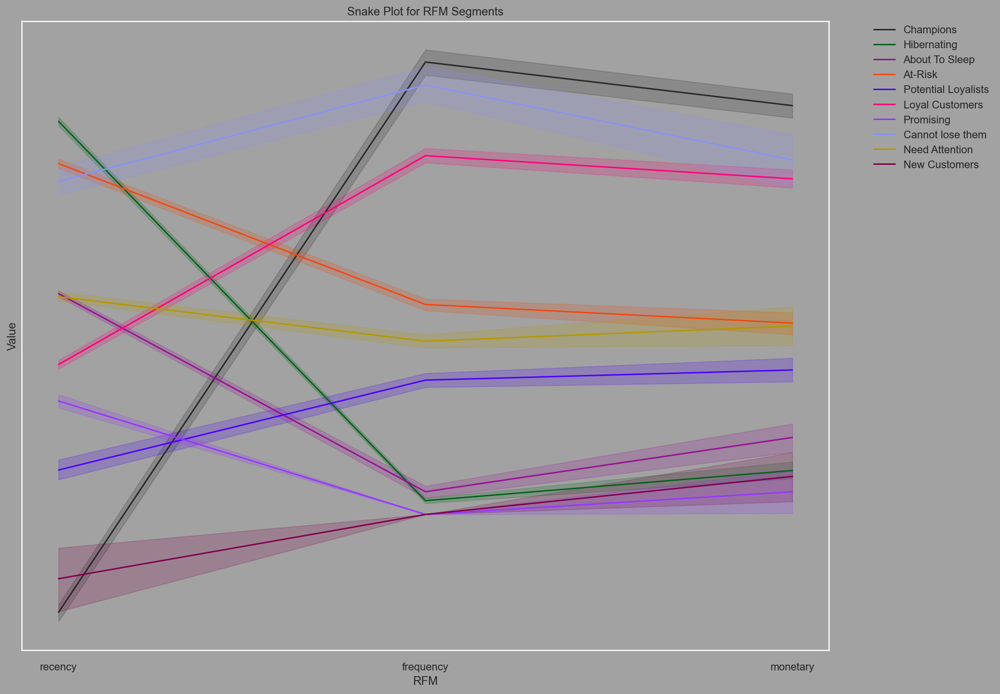

In [201]:
fig, ax = plt.subplots(figsize = (15, 12), facecolor = "#A2A2A2")
ax.set_facecolor("#A2A2A2")

sns.lineplot(x = "RFM", y = "Value", hue = "segment", data = rfm_melted, palette = palette)
ax.legend(bbox_to_anchor = (1.05, 1), loc = 2, borderaxespad = 0.)
ax.set_yticks([])
ax.set_title("Snake Plot for RFM Segments")
plt.show()

### 4.3.4 Customer Segmentation with using RFM Metrics

In [202]:
rfm_clustering.head()

,recency,frequency,monetary,segment
0,-2.15,1.64,1.58,Champions
1,-2.63,4.94,3.19,Champions
2,-1.66,0.76,1.55,Champions
3,-1.86,0.51,0.34,Champions
4,1.12,-1.05,-1.57,Hibernating


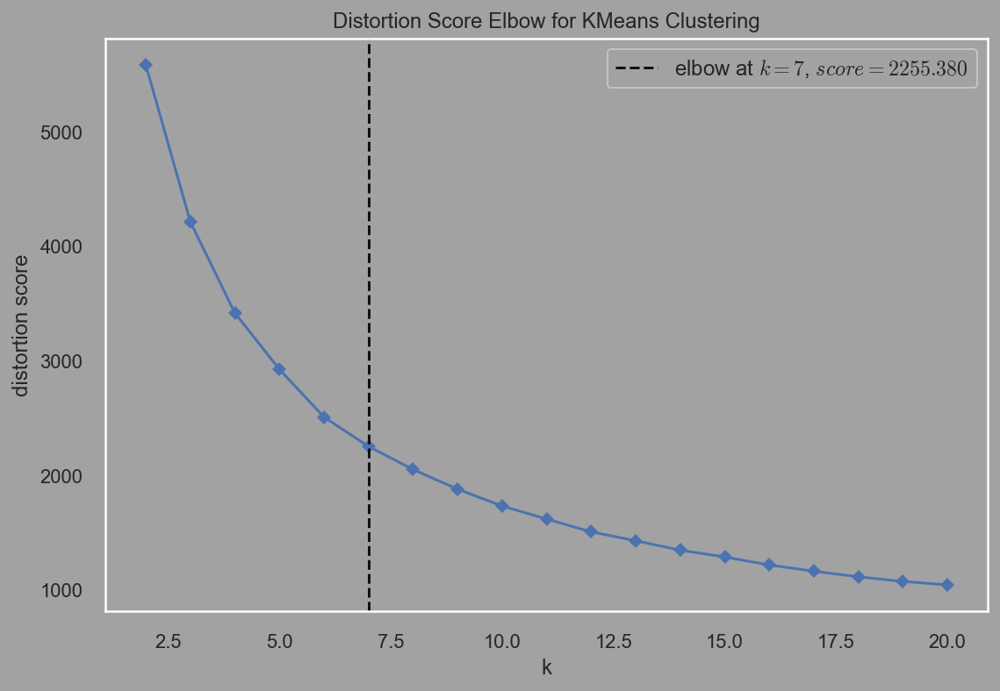

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [203]:
features = ["recency", "frequency", "monetary"]

kmeans_ = KMeans(init = "k-means++", random_state = 42)

fig, ax = plt.subplots(figsize = (9, 6), facecolor = "#A2A2A2")
ax.set_facecolor("#A2A2A2")
ax.grid(False)

visualizer = KElbowVisualizer(kmeans_, k = (2, 21), timings = False)

visualizer.fit(rfm_clustering[features]) 
visualizer.show()

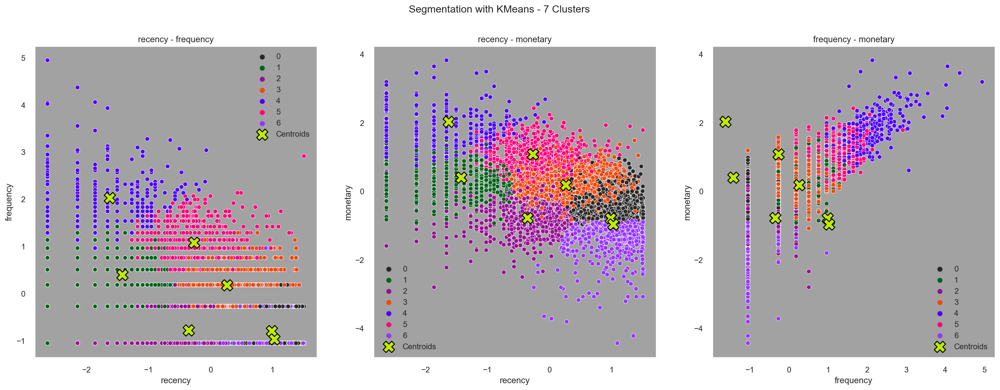

In [204]:
kmeans = KMeans(n_clusters = 7, random_state = 42) 
kmeans.fit(rfm_clustering[features])
cluster = kmeans.labels_

fig, axes = plt.subplots(1, 3, figsize = (24, 8))

for i, feature in list(enumerate(combinations(["recency", "frequency", "monetary"], 2))):

    sns.scatterplot(x = rfm_clustering[feature[0]], y = rfm_clustering[feature[1]], hue = cluster, 
                    palette = palette[: len(set(cluster))], ax = axes[i]).set_title(feature[0] + " - " + feature[1])

    sns.scatterplot(x = kmeans.cluster_centers_[:, 0], y = kmeans.cluster_centers_[:, 1],
                    s = 250, color = '#C0EB00', label = 'Centroids', marker = "X", ax = axes[i], edgecolor = "black")

plt.suptitle("Segmentation with KMeans - 7 Clusters")
for ax in axes:
    ax.set_facecolor("#A2A2A2")
    ax.grid(False)
    
plt.show()

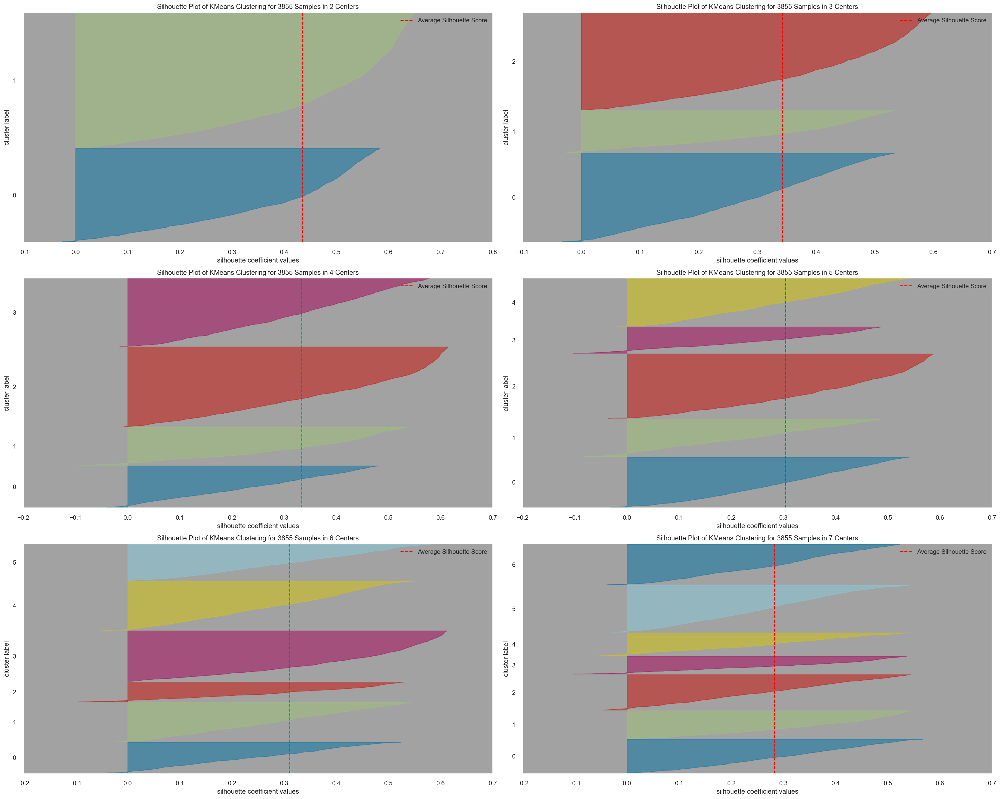

In [207]:
fig, ax = plt.subplots(3,2, figsize=(25,20))
clusters=[2,3,4,5,6,7]
for k in clusters:
    km = KMeans (n_clusters=k, init='random', n_init=10, max_iter=100, random_state=42)
    q, r = divmod(k,2) # quotient and remainder will determine plot position
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][r])
    visualizer.fit(rfm_clustering[features])
    visualizer.finalize()
    plt.tight_layout()

In [208]:
plt.rcdefaults()

In [209]:
pickle.dump(df4, open( data_processed_path+'df4.pkl', 'wb' ))

# 5.0. Time Series With Prophet

In [210]:
df5 = pickle.load(open(data_processed_path+'df3.pkl', 'rb'))

### 5.1 Data Preparation

In [212]:
df5.head()

,bill_no,quantity,date,price,customer_id,country,revenue
0,536365,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34


In [213]:
df5.set_index("date", inplace = True)
df5.head()

,bill_no,quantity,price,customer_id,country,revenue
date,,,,,,
2010-12-01 08:26:00,536365,6,2.55,17850,United Kingdom,15.30
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34
2010-12-01 08:26:00,536365,8,2.75,17850,United Kingdom,22.00
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34


### 5.1.1 Weekly

In [214]:
prices_df = pd.DataFrame(df5.groupby("date").revenue.sum())
prices_df = prices_df.iloc[:-1]
prices_df.head()

,revenue
date,
2010-12-01 08:26:00,139.13
2010-12-01 08:28:00,22.20
2010-12-01 08:34:00,348.78
2010-12-01 08:35:00,17.85
2010-12-01 09:01:00,22.20


In [215]:
weekly_prices = prices_df.resample("W").sum()
weekly_prices.head()

,revenue
date,
2010-12-05,"95,866.39"
2010-12-12,"126,618.34"
2010-12-19,"115,495.03"
2010-12-26,"25,491.64"
2011-01-02,0.00


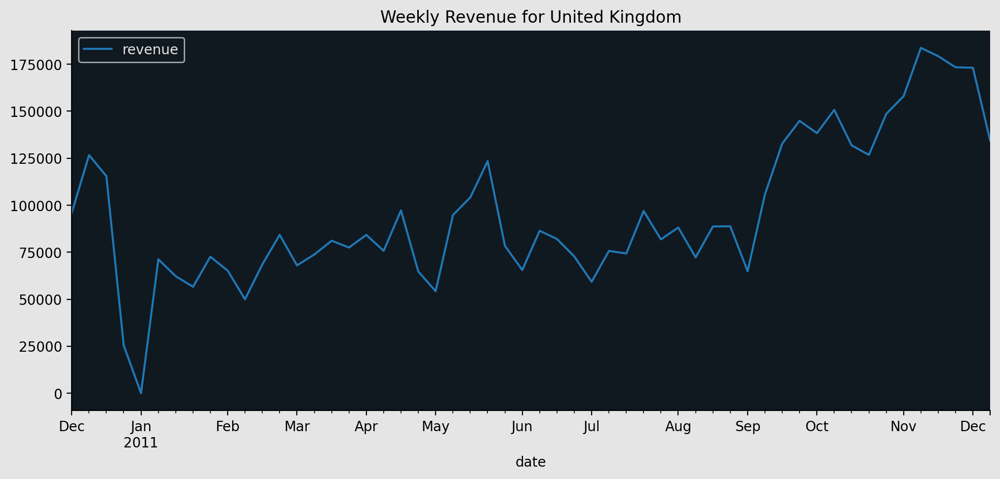

In [216]:
fig, ax = plt.subplots(figsize = (12, 5), facecolor = "#e5e5e5")
ax.set_facecolor("#101820")

weekly_prices.plot(ax = ax).set_title("Weekly Revenue for United Kingdom")
ax.legend(facecolor = "#101820", labelcolor = "#e5e5e5")

sns.despine()
plt.show()

No início de janeiro, este varejista parece ter fechado. A receita é 0.

Vemos o primeiro pico em meados de maio.

O segundo pico é no início de outubro.

Em seguida, a receita chega ao topo em meados de novembro.

### 5.1.2 Daily Data

In [217]:
daily_sales = pd.DataFrame(df5.groupby("date").sum().resample("D").sum()["revenue"])
daily_sales.head()

,revenue
date,
2010-12-01,"27,131.57"
2010-12-02,"32,040.77"
2010-12-03,"13,953.44"
2010-12-04,0.00
2010-12-05,"22,740.61"


há uma semana de receita zero no início de janeiro.

In [218]:
daily_sales.loc["2010-12-23" : "2011-1-4"]

,revenue
date,
2010-12-23,"3,755.70"
2010-12-24,0.00
2010-12-25,0.00
2010-12-26,0.00
2010-12-27,0.00
2010-12-28,0.00
2010-12-29,0.00
2010-12-30,0.00
2010-12-31,0.00


In [219]:
daily_sales.reset_index(inplace = True)
daily_sales["closed"] = np.where((daily_sales.revenue == 0), 1, 0)
daily_sales.set_index("date", inplace = True)

In [220]:
daily_sales["weekday"] = daily_sales.index.day_name()
daily_sales.head()

,revenue,closed,weekday
date,,,
2010-12-01,"27,131.57",0,Wednesday
2010-12-02,"32,040.77",0,Thursday
2010-12-03,"13,953.44",0,Friday
2010-12-04,0.00,1,Saturday
2010-12-05,"22,740.61",0,Sunday


In [221]:
daily_sales[daily_sales.revenue == 0].weekday.value_counts()

Saturday     53
Monday        6
Friday        4
Sunday        3
Tuesday       1
Wednesday     1
Thursday      1
Name: weekday, dtype: int64

não temos nenhum registro do 69º dias. 53 dos 69 dias é sábado. 

Este varejista pode ter fechado aos sábados. Vejamos as receitas totais por dia da semana.

In [222]:
daily_sales.groupby("weekday").revenue.sum()

weekday
Friday        743,857.79
Monday        837,522.65
Saturday            0.00
Sunday        621,239.51
Thursday    1,106,307.89
Tuesday       907,031.68
Wednesday     934,627.66
Name: revenue, dtype: float64

este varejista fechava aos sábados.

In [223]:
daily_sales_workdays = daily_sales[daily_sales.revenue > 0].copy()
daily_sales.drop("weekday", axis = 1, inplace = True)
daily_sales_workdays.drop("weekday", axis = 1, inplace = True)

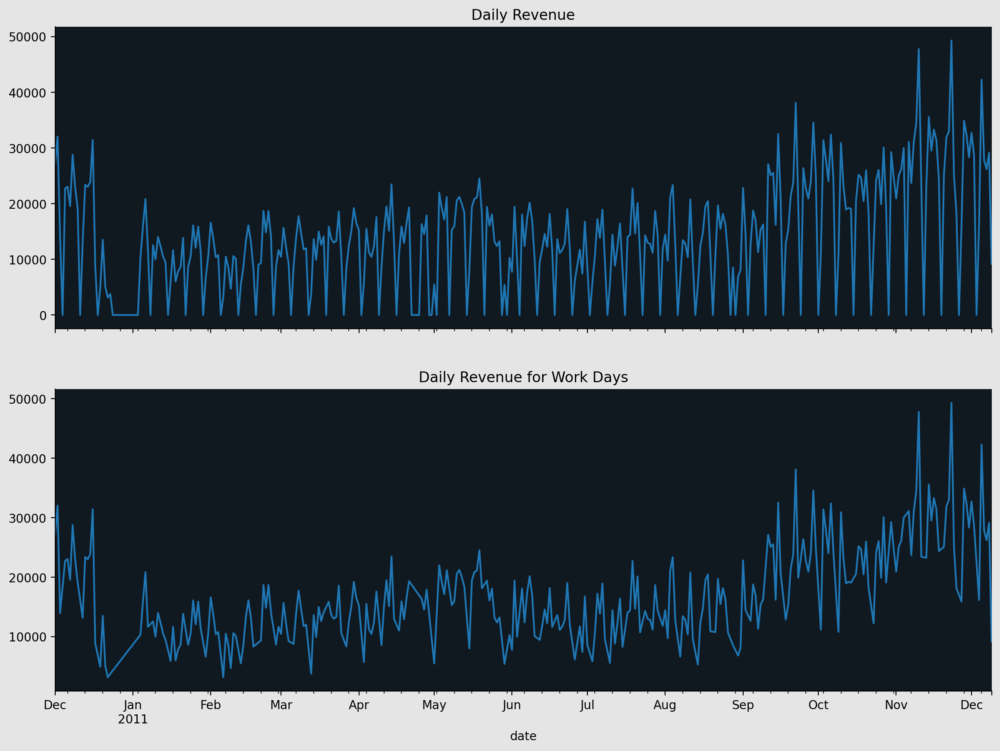

In [224]:
fig, axes = plt.subplots(2, 1, sharex = True, figsize = (14, 10), facecolor = "#e5e5e5")

for ax in axes: ax.set_facecolor("#101820")

daily_sales.revenue.plot(ax = axes[0]).set_title("Daily Revenue")
daily_sales_workdays.revenue.plot(ax = axes[1]).set_title("Daily Revenue for Work Days")

sns.despine()
plt.show()

### 5.1.3 Stationarity

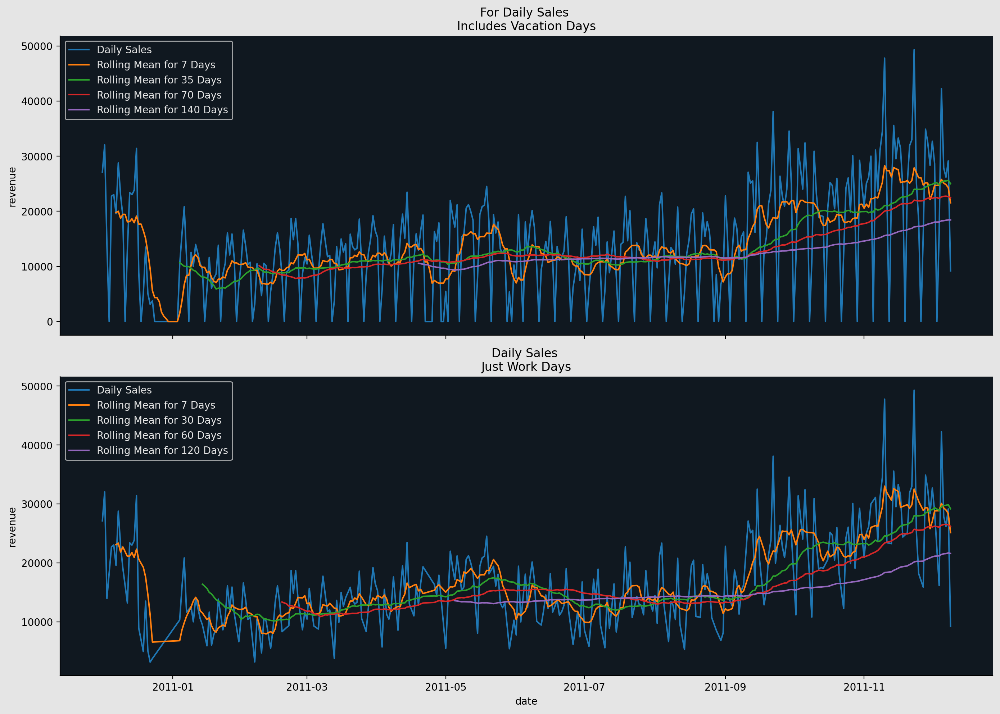

In [225]:
fig, axes = plt.subplots(2, 1, sharex = True, figsize = (14, 10), facecolor = "#e5e5e5")

for ax in axes: ax.set_facecolor("#101820")
    
sns.lineplot(x = daily_sales.index, y = daily_sales.revenue, 
             ax = axes[0], label = "Daily Sales").set_title("For Daily Sales \nIncludes Vacation Days")

sns.lineplot(x = daily_sales.index, y = daily_sales.revenue.rolling(7).mean(), 
             ax = axes[0], label = "Rolling Mean for 7 Days")
sns.lineplot(x = daily_sales.index, y = daily_sales.revenue.rolling(35).mean(), 
             ax = axes[0], label = "Rolling Mean for 35 Days")
sns.lineplot(x = daily_sales.index, y = daily_sales.revenue.rolling(70).mean(), 
             ax = axes[0], label = "Rolling Mean for 70 Days")
sns.lineplot(x = daily_sales.index, y = daily_sales.revenue.rolling(140).mean(), 
             ax = axes[0], label = "Rolling Mean for 140 Days")


sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue, 
             ax = axes[1], label = "Daily Sales").set_title("Daily Sales \nJust Work Days")

sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.rolling(6).mean(), 
             ax = axes[1], label = "Rolling Mean for 7 Days")
sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.rolling(30).mean(),
             ax = axes[1], label = "Rolling Mean for 30 Days")
sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.rolling(60).mean(), 
             ax = axes[1], label = "Rolling Mean for 60 Days")
sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.rolling(120).mean(), 
             ax = axes[1], label = "Rolling Mean for 120 Days")

for ax in axes: ax.legend(facecolor = "#101820", labelcolor = "#e5e5e5")
    
sns.despine()
plt.tight_layout()
plt.show()

Vamos verificar a estacionariedade. Estacionaridade significa que, nossa série tem média constante, variância em tempos diferentes.

Nos gráficos de acima, vimos que nossos valores médios aumentam ao longo do tempo.

Mas, vamos verificar com o teste Augmented Dickey Fuller.

#### 5.1.3.1 Augmented Dickey-Fuller Test

In [226]:
def check_adf(series, check = 0.05):
    
    adf = adfuller(series, autolag = "AIC")
    
    print(f"H0: {series.name} is non-stationary.")
    print(f"H1: {series.name} is stationary.\n")
    
    test_stat = adf[0]; print(f"ADF test statistic: {adf[0]}")
    pvalue = adf[1]; print(f"p-value: {adf[1]}")
    print(f"Number of lags: {adf[2]}")    
    print("\nCritical Values : \n")
    for key, item in adf[4].items(): print("\t", key, "\t", item)
    
    print(f"\nFor {check} significance level: \n")
    if pvalue < check:
        print("We can reject null hypothesis. This series is stationary.")
    else:
        print("We can not reject null hypothesis. This series is non-stationary.")

In [227]:
print("Performing Augmented Dickey-Fuller test for Total Price \n")

check_adf(daily_sales.revenue)

print("\nPerforming Augmented Dickey-Fuller test for Total Price (for workdays)\n")

check_adf(daily_sales_workdays.revenue)

Performing Augmented Dickey-Fuller test for Total Price 

H0: revenue is non-stationary.
H1: revenue is stationary.

ADF test statistic: -2.4348632004837665
p-value: 0.1321372800719985
Number of lags: 16

Critical Values : 

	 1% 	 -3.44880082033912
	 5% 	 -2.869670179576637
	 10% 	 -2.5711012838861036

For 0.05 significance level: 

We can not reject null hypothesis. This series is non-stationary.

Performing Augmented Dickey-Fuller test for Total Price (for workdays)

H0: revenue is non-stationary.
H1: revenue is stationary.

ADF test statistic: -1.6077854639486842
p-value: 0.479681533913556
Number of lags: 13

Critical Values : 

	 1% 	 -3.4530232710482367
	 5% 	 -2.871523926671883
	 10% 	 -2.5720897694878424

For 0.05 significance level: 

We can not reject null hypothesis. This series is non-stationary.


Para o teste ADF, esta série não é estacionária. Para torná-la estacionária, temos duas opções principais.

1- aplicar diferenciação até que fique estacionária.

2- Aplicar transformações: Log, raiz quadrada, etc.

Podemos tirar a diferença usando o método .diff().

Neste problema, nossa série tem comportamento sazonal. Nossa receita está aumentando de sábado para quinta-feira, depois diminui. Para tirar a diferença da série sazonal, precisamos definir o período no método diff.

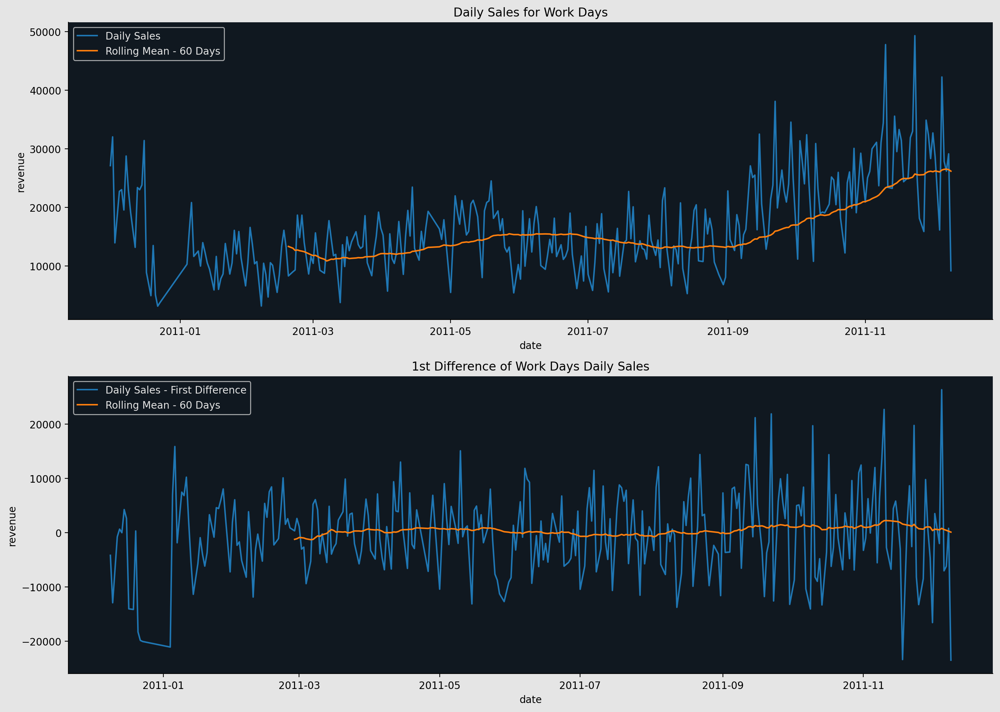

In [228]:
fig, axes = plt.subplots(2, 1, figsize = (14, 10), facecolor = "#e5e5e5")

for ax in axes: ax.set_facecolor("#101820")

sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue, 
             ax = axes[0], label = "Daily Sales").set_title("Daily Sales for Work Days")
sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.rolling(60).mean(), 
             ax = axes[0], label = "Rolling Mean - 60 Days")

sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.diff(7), 
             ax = axes[1], label = "Daily Sales - First Difference").set_title("1st Difference of Work Days Daily Sales")
sns.lineplot(x = daily_sales_workdays.index, y = daily_sales_workdays.revenue.diff(7).rolling(60).mean(), 
             ax = axes[1], label = "Rolling Mean - 60 Days")

for ax in axes: ax.legend(facecolor = "#101820", labelcolor = "#e5e5e5")

sns.despine()
plt.tight_layout()
plt.show()

Agora temos uma média constante ao longo do tempo. Vejamos os resultados do teste ADF da 1ª série diferenciada.

In [229]:
print("Performing Augmented Dickey-Fuller test for 1st Difference Revenue (All Days)")
check_adf(daily_sales["revenue"].diff(7).dropna())

print("\nPerforming Augmented Dickey-Fuller test for 1st Difference of Work Days Sales")
check_adf(daily_sales_workdays["revenue"].diff(6).dropna())

Performing Augmented Dickey-Fuller test for 1st Difference Revenue (All Days)
H0: revenue is non-stationary.
H1: revenue is stationary.

ADF test statistic: -7.232659182114952
p-value: 1.9760861408377222e-10
Number of lags: 13

Critical Values : 

	 1% 	 -3.4490114443793214
	 5% 	 -2.8697627072503757
	 10% 	 -2.5711506161673716

For 0.05 significance level: 

We can reject null hypothesis. This series is stationary.

Performing Augmented Dickey-Fuller test for 1st Difference of Work Days Sales
H0: revenue is non-stationary.
H1: revenue is stationary.

ADF test statistic: -6.121425953250846
p-value: 8.836260936519438e-08
Number of lags: 11

Critical Values : 

	 1% 	 -3.453342167806272
	 5% 	 -2.871663828287282
	 10% 	 -2.572164381381345

For 0.05 significance level: 

We can reject null hypothesis. This series is stationary.


Vamos decompor e examinar seus componentes.

### 5.1.4 Seasonality, Decomposition

In [230]:
decompose = seasonal_decompose(daily_sales["revenue"], period = 7)

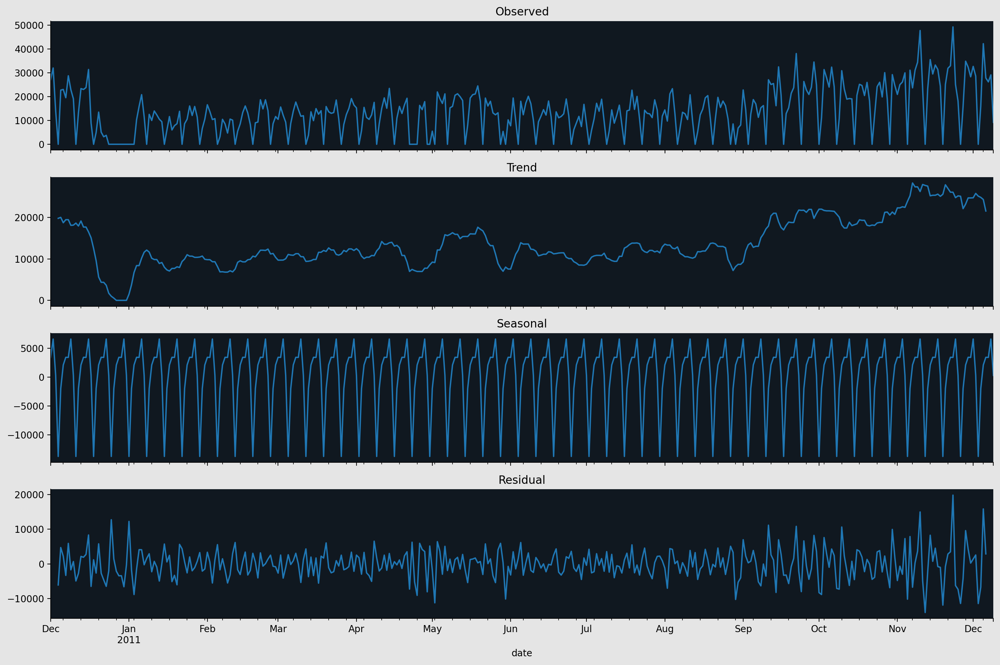

In [231]:
fig, axes = plt.subplots(4, 1, sharex = True, figsize = (15, 10), facecolor = "#e5e5e5")

for ax in axes: ax.set_facecolor("#101820")

decompose.observed.plot(ax = axes[0]).set_title("Observed")
decompose.trend.plot(ax = axes[1]).set_title("Trend")
decompose.seasonal.plot(ax = axes[2]).set_title("Seasonal")
decompose.resid.plot(ax = axes[3]).set_title("Residual")

sns.despine()
plt.tight_layout()
plt.show()

Sabemos que temos sazonalidade semanal.

Precisamos de um `Residual` com distribuição normal. Vamos olhar para ele.

In [232]:
def diagnostic_plots2(df, variable):
    # plot the histograms to have a quick look at the distributions
    # we can plot Q-Q plots to visualise if the variable is normally distributed
    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable
    
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    df.resid.hist()

    plt.subplot(1, 2, 2)
    stats.probplot(decompose.resid.dropna(), dist="norm", plot=pylab)
    #sm.qqplot(decompose.resid.dropna(), ax = axes[1], marker = "x", line = "45", fit = True)
    #axes[1].set_title("QQ Plot for Residual")

    plt.show()

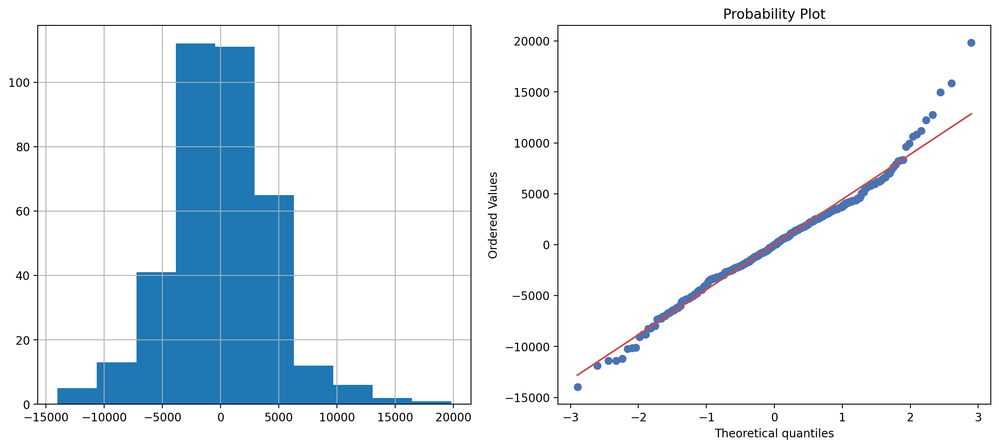

In [233]:
diagnostic_plots2(decompose,'resid')

Como podemos ver o gráfico kde e o gráfico QQ, o resíduo tem distribuição normal.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning:

The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.



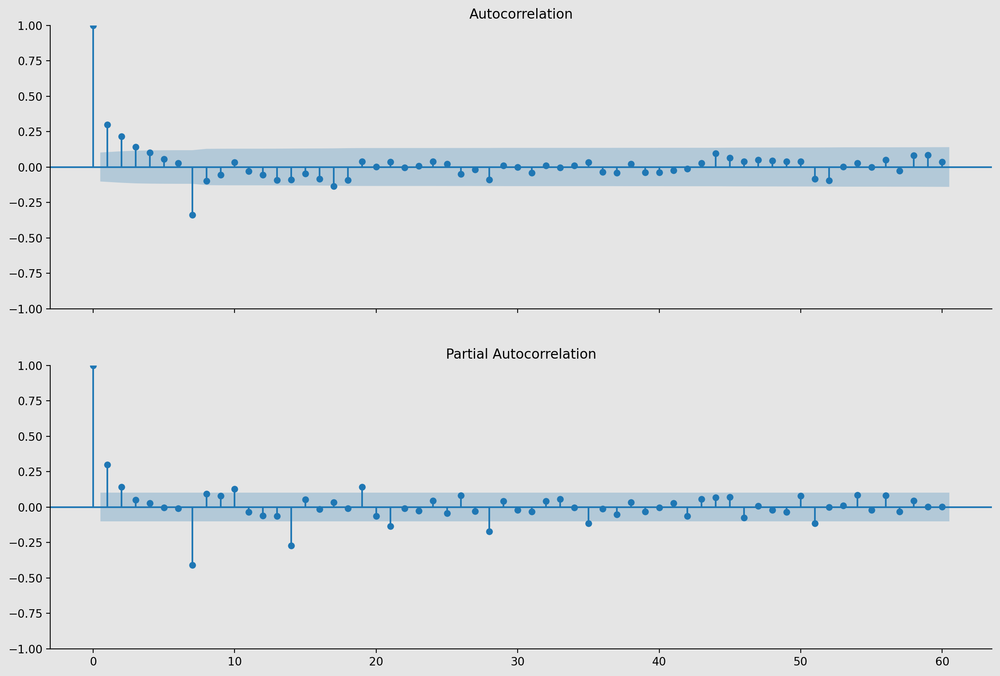

In [234]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

fig, axes = plt.subplots(2, 1, sharex = True, figsize = (15, 10), facecolor = "#e5e5e5")

for ax in axes: ax.set_facecolor("#e5e5e5")
    
plot_acf(daily_sales["revenue"].diff(7).dropna(), lags = 60, ax = axes[0])
plot_pacf(daily_sales["revenue"].diff(7).dropna(), lags = 60, ax = axes[1])

sns.despine()
plt.show()

In [235]:
df6 = df5.copy()

In [236]:
df7 = df6.copy()

In [237]:
df7.head()

,bill_no,quantity,price,customer_id,country,revenue
date,,,,,,
2010-12-01 08:26:00,536365,6,2.55,17850,United Kingdom,15.30
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34
2010-12-01 08:26:00,536365,8,2.75,17850,United Kingdom,22.00
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34
2010-12-01 08:26:00,536365,6,3.39,17850,United Kingdom,20.34


In [238]:
df8 = df7.copy()

### 5.2 Modeling

Usarei dados diários de vendas para treinamento de modelos.

Para o conjunto de treinamento, apenas recebo os primeiros 85% dos registros de todos os dias e a parte restante é o conjunto de validação.

esse conjunto de dados não é totalmente conveniente para previsão. Temos dados de um ano e depois do pico maior, não temos muitas observações para prever o comportamento dos dados.

In [239]:
daily_data = daily_sales[["revenue"]].dropna().reset_index()

daily_data.columns = ["ds", "y"]

train_size = int(0.85 * len(daily_data))

train = daily_data.iloc[:train_size]
val = pd.DataFrame(daily_data.iloc[train_size:])

print(f"Training Days:\t\t{len(train)} \nValidation Days:\t {len(val)}")

Training Days:		317 
Validation Days:	 57


In [240]:
def scores(y_true, y_pred):
    print(f"R2: {r2_score(y_true, y_pred)}")
    print(f"MSE: {mean_squared_error(y_true, y_pred)}")
    print(f"Correlation: {np.corrcoef(y_true, y_pred)[0][1]}")

#### 5.2.1 Simple Model

In [241]:
from fbprophet import Prophet

model = Prophet()

model.fit(train)

val_pred = model.predict(val)
train_pred = model.predict(train)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append 

In [242]:
print("For Training set: \n")
scores(train.y, train_pred.yhat)

print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)

For Training set: 

R2: 0.5479129105224019
MSE: 29832762.80699585
Correlation: 0.7404277840866414

For Validation set: 

R2: 0.4300599877627618
MSE: 78850907.70441091
Correlation: 0.8312100442158608


O primeiro modelo é um modelo simples com parâmetros padrão. Não temos bons resultados, temos 53% R2 para treinamento e 48% R2 para conjunto de validação.

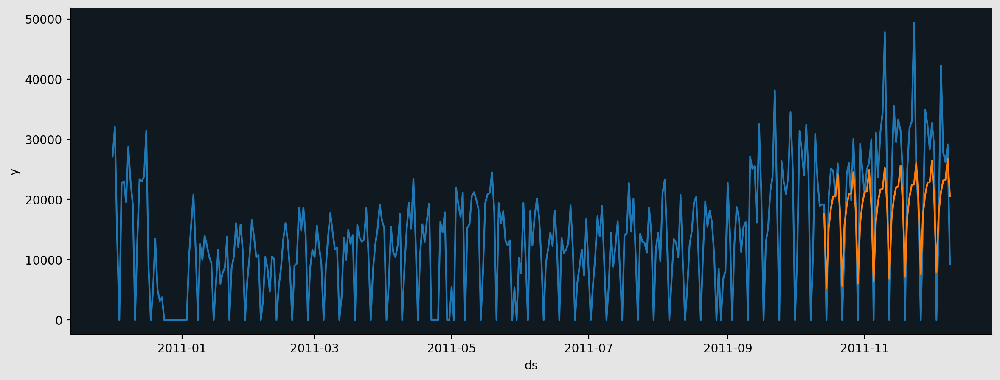

In [243]:
fig, ax = plt.subplots(figsize = (14, 5), facecolor = "#e5e5e5")
ax.set_facecolor("#101820")

sns.lineplot(x = daily_data.ds, y = daily_data.y, ax = ax)
sns.lineplot(x = val_pred.ds, y = val_pred.yhat, ax = ax)

sns.despine()
plt.show()

Parece que o modelo não captura picos enormes.

Vamos adicionar alguns parâmetros.

#### 5.2.2 Fine Tuning

In [244]:
# add Holydays
black_friday = pd.DataFrame(
    {
        "holiday": "black friday",
        "ds": pd.to_datetime(["2011-11-24", "2012-11-23", "2013-11-22"]),
        "lower_window": 0,
        "upper_window": 1
    }
)

Aos sábados, não temos nenhum registro de venda. Vou simplesmente adicionar a coluna "is_saturday" como um regressor extra.

In [245]:
def is_saturday(ds):
    date = pd.to_datetime(ds)
    return date.day_name() == "Saturday"

daily_data["is_saturday"] = daily_data["ds"].apply(is_saturday)

train = daily_data.iloc[:train_size]
val = pd.DataFrame(daily_data.iloc[train_size:])

In [246]:
model = Prophet(
    holidays = black_friday,
    daily_seasonality = True, 
    weekly_seasonality = True,
    holidays_prior_scale = 1,
    seasonality_prior_scale = 5,
    changepoint_prior_scale = 1,
)

model.add_country_holidays(country_name = "UK")

model.add_regressor("is_saturday")

model.fit(train)

val_pred = model.predict(val)
train_pred = model.predict(train)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [247]:
print("For Training set: \n")
scores(train.y, train_pred.yhat)

print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)

For Training set: 

R2: 0.7412513060433954
MSE: 17074560.61695354
Correlation: 0.8610567967941086

For Validation set: 

R2: 0.5104029217888963
MSE: 67735504.0837237
Correlation: 0.8125729087583082


Obtemos 51% em R2 no conjunto de validação.

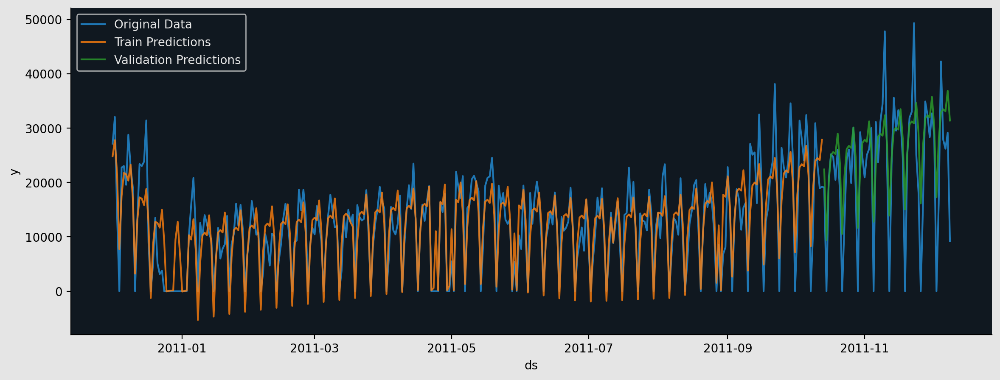

In [248]:
fig, ax = plt.subplots(figsize = (14, 5), facecolor = "#e5e5e5")
ax.set_facecolor("#101820")

sns.lineplot(x = daily_data.ds, y = daily_data.y, ax = ax, label = "Original Data")
sns.lineplot(x = train_pred.ds, y = train_pred.yhat, alpha = 0.8, ax = ax, label = "Train Predictions")
sns.lineplot(x = val_pred.ds, y = val_pred.yhat, ax = ax, alpha = 0.8, label = "Validation Predictions")

ax.legend(labelcolor = "#e5e5e5", facecolor = "#101820")
sns.despine()
plt.show()

recebemos previsões com valor negativo


Para me livrar disso, vou defini-los manualmente como zero.

In [249]:
train_pred["yhat"] = np.where((train_pred.is_saturday == 0), train_pred.yhat, 0)
val_pred["yhat"] = np.where((val_pred.is_saturday == 0), val_pred.yhat, 0)

print("For Training set: \n")
scores(train.y, train_pred.yhat)

print("\nFor Validation set: \n")
scores(val.y, val_pred.yhat)

For Training set: 

R2: 0.7616755461282725
MSE: 15726785.98647392
Correlation: 0.8735479654792359

For Validation set: 

R2: 0.6976885660786039
MSE: 41824631.47402558
Correlation: 0.8453202044603311


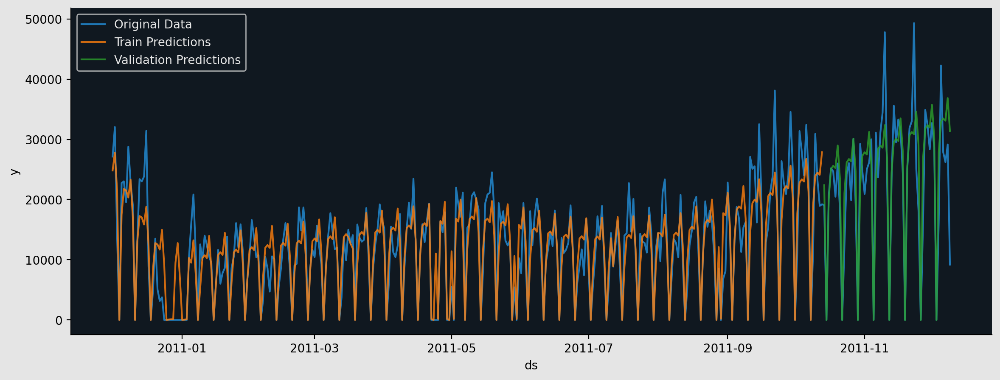

In [250]:
fig, ax = plt.subplots(figsize = (14, 5), facecolor = "#e5e5e5")
ax.set_facecolor("#101820")

sns.lineplot(x = daily_data.ds, y = daily_data.y, ax = ax, label = "Original Data")
sns.lineplot(x = train_pred.ds, y = train_pred.yhat, alpha = 0.8, ax = ax, label = "Train Predictions")
sns.lineplot(x = val_pred.ds, y = val_pred.yhat, ax = ax, alpha = 0.8, label = "Validation Predictions")

ax.legend(labelcolor = "#e5e5e5", facecolor = "#101820")
sns.despine()
plt.show()

O modelo não consegue capturar bem picos repentinos. 

temos que investigar as razões subjacentes a esses picos. 
É anual sazonal, ou não?

 Não podemos detectá-lo, pois temos apenas dados de um ano.

#### 5.2.3 Forecasting Future

novo modelo de previsão para o próximo ano. Eu apenas adiciono sazonalidade anual ao último modelo que usamos.

In [251]:
model = Prophet(
    holidays = black_friday,
    daily_seasonality = True, 
    weekly_seasonality = True,
    yearly_seasonality = True,
    holidays_prior_scale = 1,
    seasonality_prior_scale = 5,
    changepoint_prior_scale = 1,
)

model.add_country_holidays(country_name = "UK")

model.add_regressor("is_saturday")

model.fit(daily_data)

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [252]:
future = model.make_future_dataframe(periods = 365)

future["is_saturday"] = future["ds"].apply(is_saturday)
future.tail()

,ds,is_saturday
734,2012-12-04,False
735,2012-12-05,False
736,2012-12-06,False
737,2012-12-07,False
738,2012-12-08,True


In [253]:
forecast = model.predict(future)
forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail()

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

c:\Users\humbe\anaconda3\envs\time_series\lib\site-packages\fbprophet\forecaster.py:891: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,ds,yhat,yhat_lower,yhat_upper
734,2012-12-04,"28,210.48","22,340.67","33,647.01"
735,2012-12-05,"27,415.23","22,113.71","33,834.84"
736,2012-12-06,"30,130.06","24,375.46","35,770.60"
737,2012-12-07,"23,073.54","17,448.29","28,533.93"
738,2012-12-08,"7,564.74","1,905.02","13,452.74"


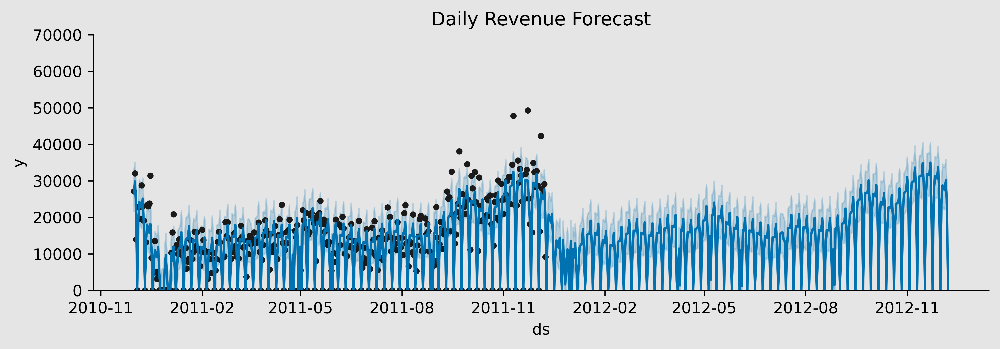

In [254]:
forecast["yhat"] = np.where((forecast.is_saturday == 0), forecast.yhat, 0)
forecast["yhat_lower"] = np.where((forecast.is_saturday == 0), forecast.yhat_lower, 0)
forecast["yhat_upper"] = np.where((forecast.is_saturday == 0), forecast.yhat_upper, 0)

fig, ax = plt.subplots(figsize = (9, 3), facecolor = "#e5e5e5", dpi = 300)

model.plot(forecast, ax = ax)

ax.set_title("Daily Revenue Forecast")
ax.grid(False)
ax.set_facecolor("#e5e5e5")
ax.set_ylim(0, 70000)

sns.despine()
plt.show()

Aqui estão os resultados das previsões deste ano e do próximo ano. Os pontos pretos representam a receita real e as linhas azuis representam as previsões.

Se olharmos para a previsão do ano que vem, podemos ver picos menores no meio do ano, e também temos tendência positiva no final do ano.